<a id="Table-Of-Contents"></a>
# Содержание
* [1. Описание задачи.](#Task-Details)
* [2. Описание имеющихся данных, процесса их сбора, подготовки и формирования исходного датасета.](#Data-Analysis)
* [3. Получение временного ряда.](#TS-receive)
    * [3.1 Чтение данных.](#Read-in-Data)
    * [3.2 Описание переменных.](#Feature-Description)
    * [3.3 Подготовка временного ряда.](#TS-Prep)
* [4. Анализ временного ряда.](#TS-Analysis)
    * [4.1 Тренд, сезонность.](#Trend-Season-Cycl)
    * [4.2 Стационарность.](#Stationarity)
* [5. Моделирование и прогнозирование временного ряда.](#TS-Modeling-Forecasting)
    * [5.1 Модель ARIMA.](#ARIMA)
    * [5.2 Применение искусственных нейронных сетей.](#NN)
* [6. Выводы по результатам вариантов решения задачи и выбор оптимального варианта.](#TS-Modeling-Forecasting-Conclusion)
* [7. Выводы.](#Conclusion)

In [1]:
from datetime import datetime 
start_time = datetime.now()

<a id="Task-Details"></a>
# 1. Описание задачи

    Прогнозирование продаж — это деятельность руководства компании, направленная на определение предполагаемого объема продукции, который будет продан за установленный период времени с использованием имеющихся ресурсов.
    Прогнозирование продаж способствует своевременному выявлению проблем и помогает в принятии решений, направленных на устранение недостатков. Оно необходимо при распределении ресурсов, при постановке целей и бюджетировании, при планировании найма персонала.
    Цель прогнозирования продаж – описание будущих тенденций на определенный промежуток времени и создание основы для планирования продаж. Прогнозирование подразумевает, что за ним последуют действия по бюджетированию, планированию и воплощению прогнозов в реальность.
    При прогнозировании объема продаж используются определенные методы прогноза. 
    К ним относятся следующие методы:
    - экспертный
    - статистический
    Экспертный метод прогноза продаж - метод исследования, котрый опирается на мнение руководителей, сотрудников компании и предпочтения потенциальных потребителей.
    Статистический метод прогноза продаж - это метод исследования, опирающийся на математические рассчеты, применяемые к данным о продажах прошлых периодов.
    Оба этих метода применяются на практике и, зачастую, результат анализа - прогноз - является компиляцией выводов, полученных при совместном использовании этих методик.
    
    Целью данной дипломной работы является исследование практической применимости статистического метода прогнозирования объемов продаж и получение прогнозных данных об объеме продаж на требуемый период.
    В работе будут использованы реальные данные о продажах в розничной сети производителя мягкой мебели за несколько лет работы.


* [Содержание](#Table-Of-Contents)

<a id="Data-Analysis"></a>
# 2. Описание имеющихся данных, процесса их сбора, подготовки и формирования исходного датасета

    Исходные данные - это объем продаж в разрезе каждого дня за период 5 лет.
    Информация о продажах накапливается в системе оперативного учета "ПС:Управление мебельной фабрикой", разработанной на базе платформы 1С УПП 8.3.
    С применением встроенных средств информационной системы получен отчет о продажах за период 5 лет, данные выгружены в формате .CSV и сохранены на локальном диске в файле "ts_days.csv".
    Далее, данные загружаются в DataFrame pandas и из них формируется непрерывный временной ряд значений с дискретностью 1 день. Значения продаж в пропущенных днях (2019-01-01) заменены на "0" ввиду того обстоятельства, что пропущенный день - это Новый год, и, как показал анализ предыдущих лет, значение продаж в Новый год исчезающе мало, т.е., стремится к "0".
    Таким образом, получен временной ряд по продажам продукции, который необходимо исследовать и выполнить на его основе прогноз продаж на период 90 дней.


* [Содержание](#Table-Of-Contents)

<a id="TS-receive"></a>
# 3. Получение временного ряда

<a id="Read-in-Data"></a>
# 3.1 Чтение данных

In [2]:
# система
import os
import sys
import pickle
import warnings

# стандартные библиотеки
import numpy as np
import pandas as pd

# метрика и номализатор
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler

# статистические мктоды анализа временных рядов
from statsmodels.tsa.arima.model import ARIMA, ARIMAResults
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, acf

# графика
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# загржаю внешние скрипты
path_to_local_data = os.path.abspath(os.path.relpath(os.getcwd(), start = 'sales_volume_forecasting'))
sys.path.append(path_to_local_data + '/scripts')

# метод Singular Spectrum Analysis (SSA)
from ssa import SSA
# процедуры подготовки временного ряда для обработки с помощью искусственной нейронной сетью
from NN import ts_feature_preparation, lstm_model, model_fit, pict_loss_val_loss
from NN import test_feature_preparation, test_predict, pict_predict, load_model

2026-02-09 12:46:28.889456: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2026-02-09 12:46:28.913500: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


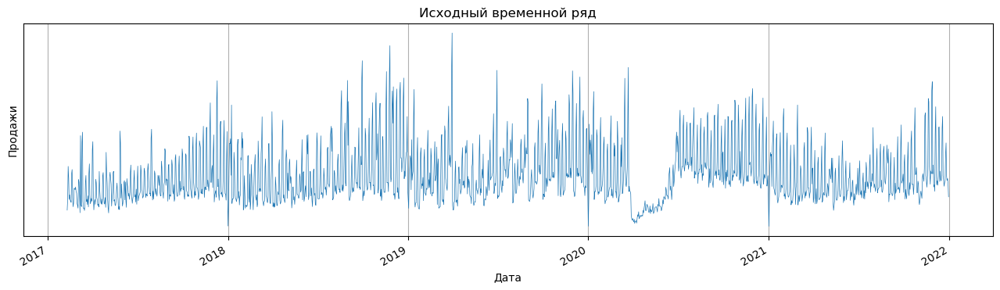

In [4]:
# загружаю данные по продажам
df_CD = pd.read_csv('../data/ts_days.csv', header = None, sep = ';', skiprows = 520, names = ['date', 'summ'])
# привожу данные к нужным типам
df_CD['date'] = pd.to_datetime(df_CD['date'], format = "%d.%m.%Y")
df_CD['summ'] = df_CD['summ'].astype('float64')
# установливаю дату в качестве индекса
df_CD = df_CD.set_index('date')
# рисую
df_CD.plot(figsize = (16, 4), yticks = [], lw = .5, title = 'Исходный временной ряд', grid = True, \
          xlabel = 'Дата', ylabel = 'Продажи', legend = False)
plt.savefig('../report/ts_days.png')
plt.show()

    Первые 520 записей пропущены, т.к. они не корректны.

* [Содержание](#Table-Of-Contents)

<a id="Feature-Description"></a>
# 3.2 Описание переменных

    Получили массив данных "дата"-"сумма продаж" (с 9/02/2017 по 3/02/2022, суммы "по заказам" из 1С).

In [5]:
df_CD.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1786 entries, 2017-02-09 to 2021-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   summ    1786 non-null   float64
dtypes: float64(1)
memory usage: 27.9 KB


In [6]:
#df_CD.head()

    Индекс датасета - дата измерения, "summ" - величина измерения

* [Содержание](#Table-Of-Contents)

<a id="TS-Prep"></a>
# 3.3 Подготовка временного ряда

    Нахожу пропущенные даты и присваиваю меткам выбранное значение, анализирую выбросы.

In [7]:
# генерирую синтетический набор от стартовой до конечной даты исходного временного ряда, без пропусков, 
# частота = "день"
timerange = pd.date_range(start = df_CD.index[0], end = df_CD.index[-1], freq = 'D')
# генерирую датасет
df2 = pd.DataFrame(index = timerange)
# объединяю исходный временной ряд с синтетическим
# там, где в исходном ряде пропущены даты, получим пропущенную дату и NaN в столбце "summ"
newdf = df_CD.join(df2, how = 'outer')
print(f'Было пропущено дней: {newdf.shape[0] - df_CD.shape[0]}')
print(f'Пропущенные даты: {newdf[newdf.summ.isna()].index.format()}')

Было пропущено дней: 1
Пропущенные даты: ['2019-01-01']


/tmp/ipykernel_465956/1765257986.py:10: FutureWarning: DatetimeIndex.format is deprecated and will be removed in a future version. Convert using index.astype(str) or index.map(formatter) instead.
  print(f'Пропущенные даты: {newdf[newdf.summ.isna()].index.format()}')


    Пропущенный день 01/01/2019 является праздничным днем, исторически, объем продаж 01/01 исчезающе мал.
    Т.о., заменим значение продаж в пропущенный день на "0".

In [8]:
df_CD = newdf.fillna(0.0)
df_CD.shape

(1787, 1)

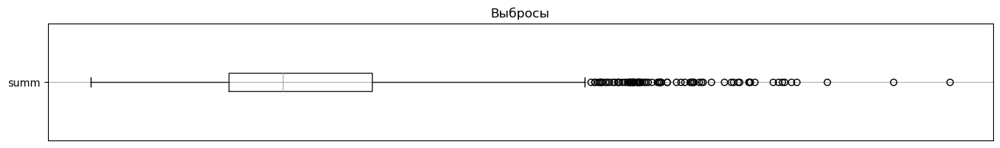

In [9]:
# выбросы
df_CD.boxplot(figsize = (16, 2), vert = False)
plt.title('Выбросы')
plt.xticks([])
plt.show()

    Выбросы в значениях меток присутствуют. Но, учитывая, что это данные, которые используются в регламентированном учете, есть мнение, что данные истинны. Решение - оставляю, как есть.

In [10]:
# итоговый временной ряд для анализа
df_CD.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1787 entries, 2017-02-09 to 2021-12-31
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   summ    1787 non-null   float64
dtypes: float64(1)
memory usage: 27.9 KB


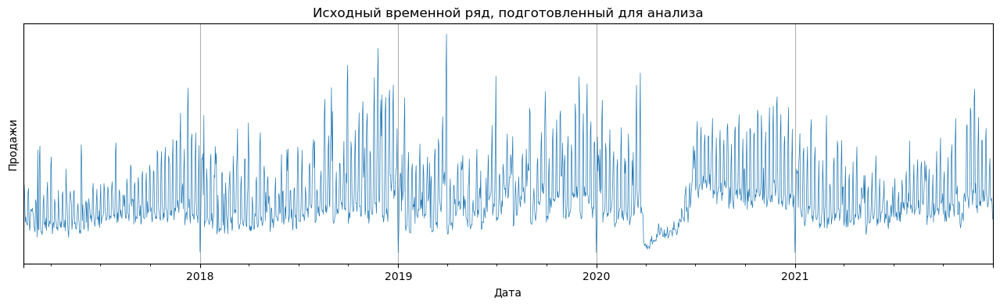

In [11]:
df_CD.plot(figsize = (16, 4), yticks = [], lw = .5, title = 'Исходный временной ряд, подготовленный для анализа', \
           grid = True, xlabel = 'Дата', ylabel = 'Продажи', legend = False)
plt.show()

* [Содержание](#Table-Of-Contents)

<a id="TS-Analysis"></a>
# 4. Анализ временного ряда

    Алгоритм анализа:
    1. из исходного ряда выделяем недельную сезонность, фиксируем
    2. из исходного ряда вычитаем ряд недельной сезонности и выделяем месячную сезонность, фиксируем
    3. из исходного ряда вычитаем ряды недельной и месячной сезонности, выделяем годовую сезонность, фиксируем
    4. из исходного ряда вычитаем все вышеперечисленные компоненты, выделяем тренд и шумы, фиксируем
    5. фиксируем остаток временного ряда после вычета всех выше перечисленных компонент

<a id="Trend-Season-Cycl"></a>
# 4.1 Тренд, сезонность, шум.

    Для определения характеристик временного ряда воспользуемся методом Singular Spectrum Analysis.

In [12]:
# исходный временной ряд по дням
ts = df_CD['summ'].copy()

In [13]:
# нормализуем исходный ряд
scaler = MinMaxScaler(feature_range = (0, 1))
ts = scaler.fit_transform(ts.values.reshape(-1, 1)).reshape(1,-1)[0]
ts.shape

(1787,)

In [14]:
# данные составляющих исходного временного ряда
ts_components = {}

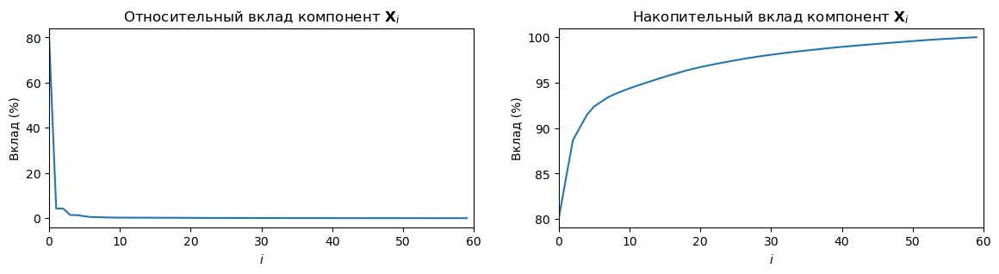

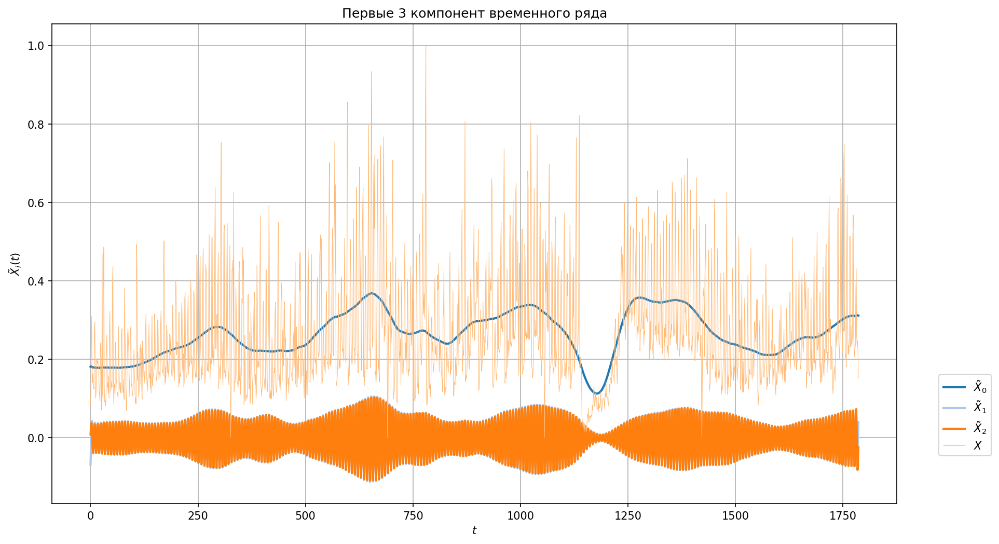

In [15]:
# недельная сезонность
L = 60 # окно анализа, подобрано экспериментально
ssa = SSA(L, ts)
ssa.trajectory_matrix()
ssa.SVD()
ssa.pict_contribution_of_components()
ssa.pict_components(3)

    Наблюдаем Хо локальный тренд, Х1 и Х2 систематические компоненты малой периодичности.
    Увеличим масштаб - определим периодичность.

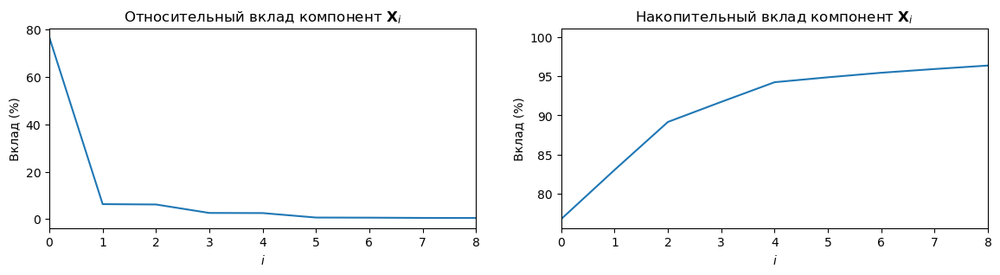

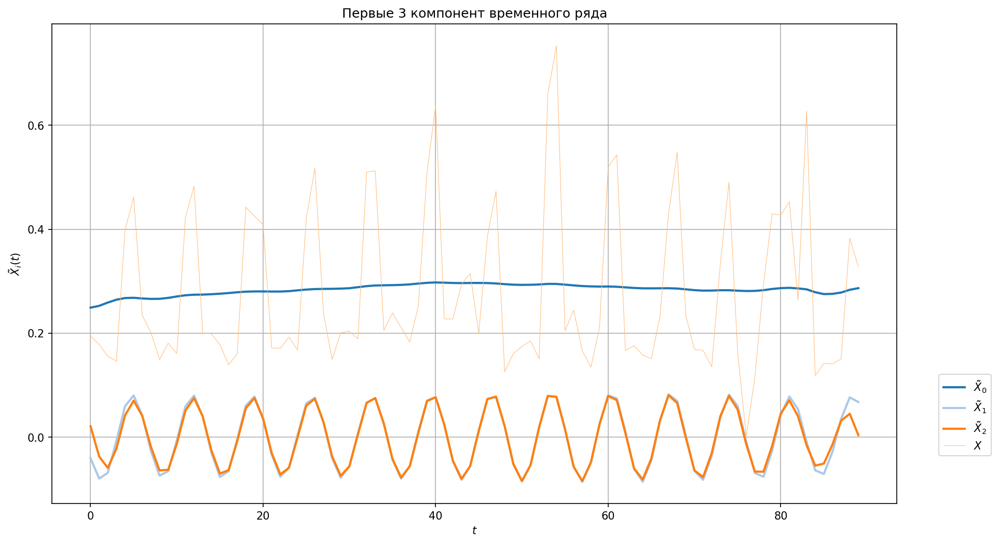

In [16]:
L = 60
_ssa = SSA(L, ts[250:340]) # берем 3 месяца
_ssa.trajectory_matrix()
_ssa.SVD()
_ssa.pict_contribution_of_components(8)
_ssa.pict_components(3)

    Наблюдаем компоненты Х1 и Х2 с периодичностью в неделю.

In [17]:
# фиксируем недельные составляющие временного ряда
ts_components['недельный №1'] = {'X' : ssa.Xi_ts[1]} # недельная сезонность №1
ts_components['недельный №2'] = {'X' : ssa.Xi_ts[2]} # недельная сезонность №2

In [18]:
def ts_subtracting_components(ts, ts_components):
    """ Вычитает из исходного ряда все выделенные компоненты """
    
    for key in ts_components.keys():
        ts = ts - ts_components[key]['X']
    
    return ts

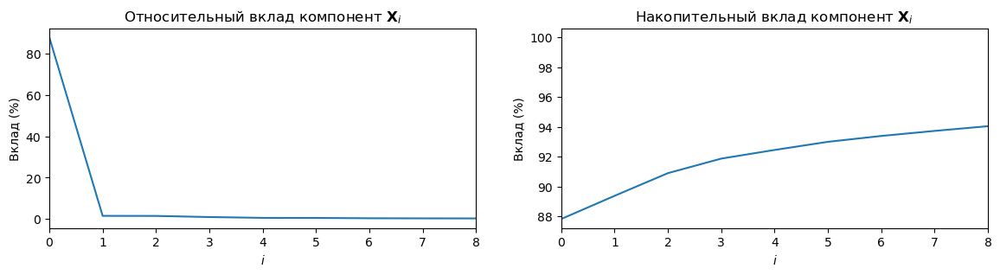

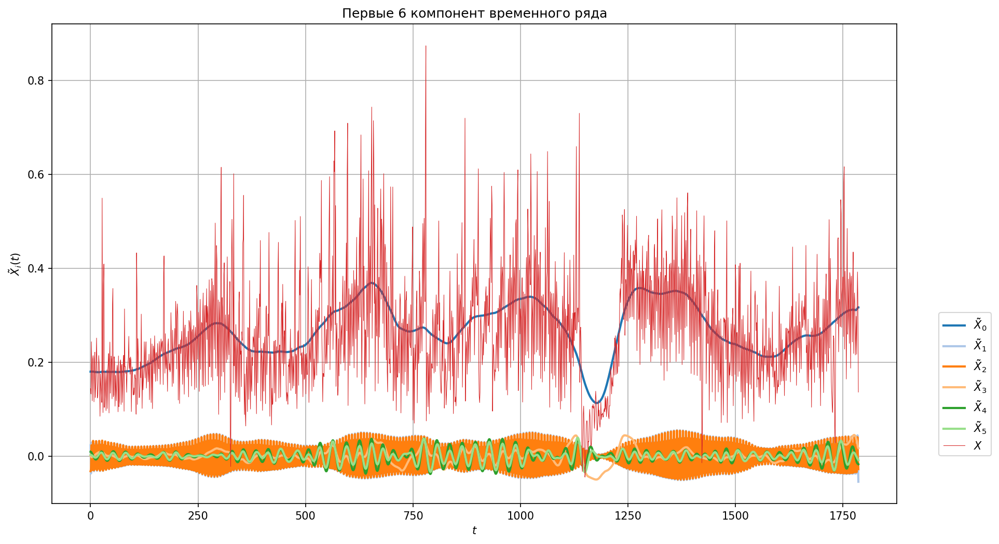

In [19]:
# месячная сезонность
# из исходного ряда вычитаю недельную сезонность
_ts = ts_subtracting_components(ts, ts_components)

# выделяю месячную сезонность
L = 60
ssa = SSA(L, _ts)
ssa.trajectory_matrix()
ssa.SVD()
ssa.pict_contribution_of_components(8)
ssa.pict_components(6)

    Наблюдаем компоненты Х4 и Х5 с периодичностью в месяц.

In [20]:
# фиксирую месячные составляющие временного ряда
ts_components['месячный №1'] = {'X' : ssa.Xi_ts[4]} # месячная сезонность №1
ts_components['месячный №2'] = {'X' : ssa.Xi_ts[5]} # месячная сезонность №2

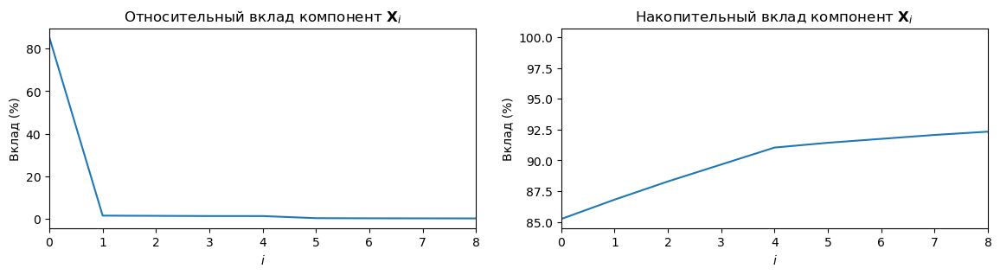

In [21]:
# сезонность с периодичностью 1 год
# из исходного ряда вычитаю недельную и месячную сезонность
_ts = ts_subtracting_components(ts, ts_components)

# выделяю тренд и шумы
L = 360
ssa = SSA(L, _ts)
ssa.trajectory_matrix()
ssa.SVD()
ssa.pict_contribution_of_components(8)

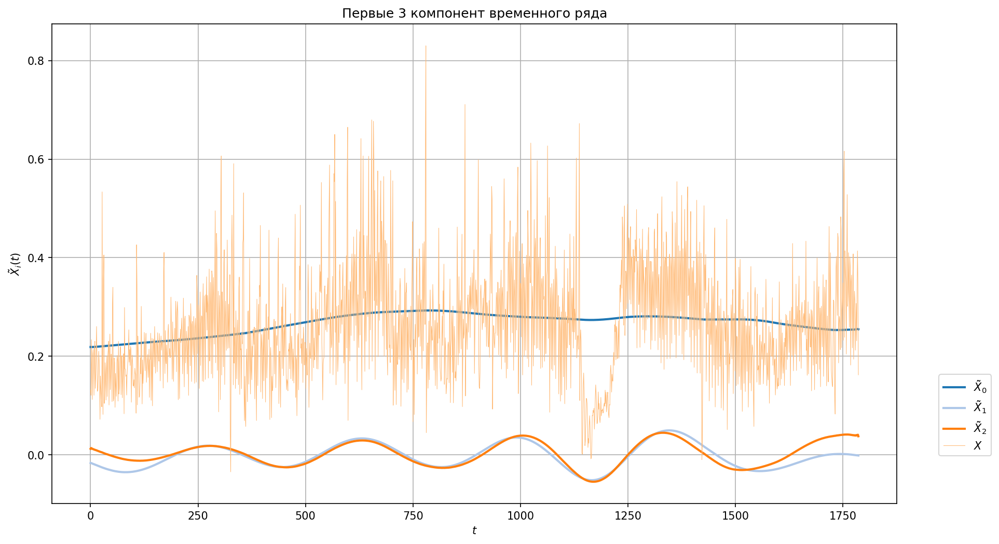

In [22]:
ssa.pict_components(3)

    Наблюдаем сезонность с перодичностью 1 год, компоненты Х1 и Х2.

In [23]:
# фиксируем сезонность с периодичностью 1 год
ts_components['годовая №1'] = {'X' : ssa.Xi_ts[1]} # годовая сезонность №1
ts_components['годовая №2'] = {'X' : ssa.Xi_ts[2]} # годовая сезонность №2

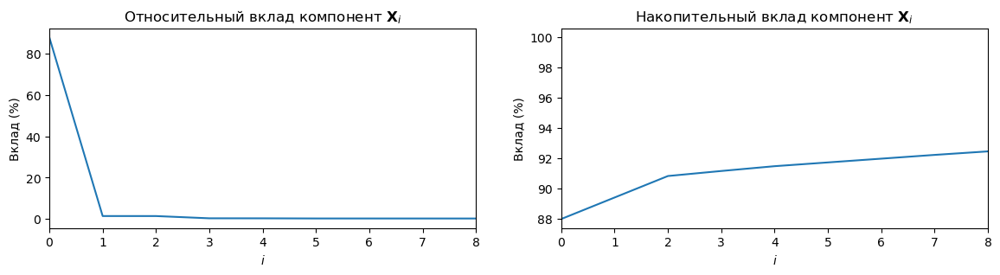

In [24]:
# тренд и шум
# из исходного ряда вычитаем недельную, месячную и годовую сезонность
_ts = ts_subtracting_components(ts, ts_components)

# выделяем тренд и шумы
L = 360
ssa = SSA(L, _ts)
ssa.trajectory_matrix()
ssa.SVD()
ssa.pict_contribution_of_components(8)

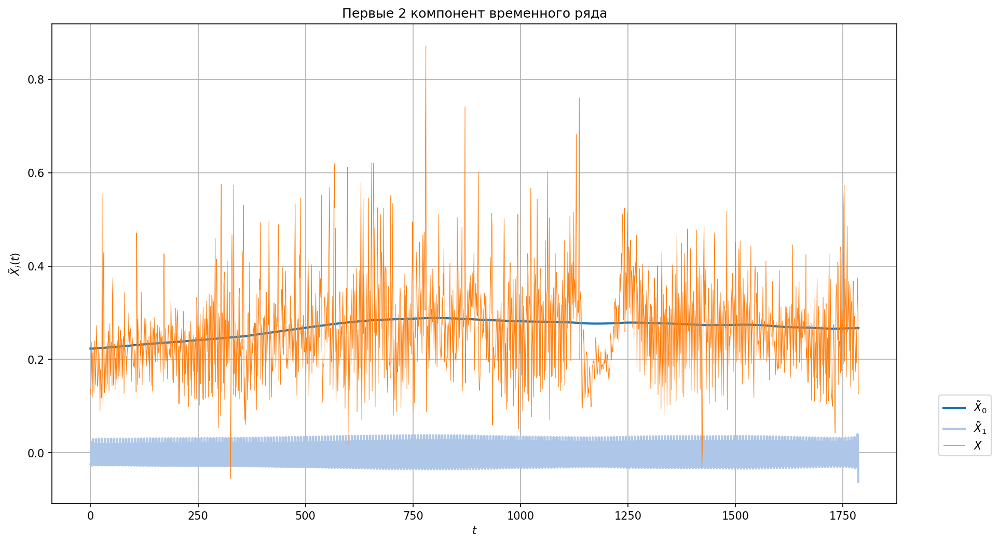

In [25]:
ssa.pict_components(2)

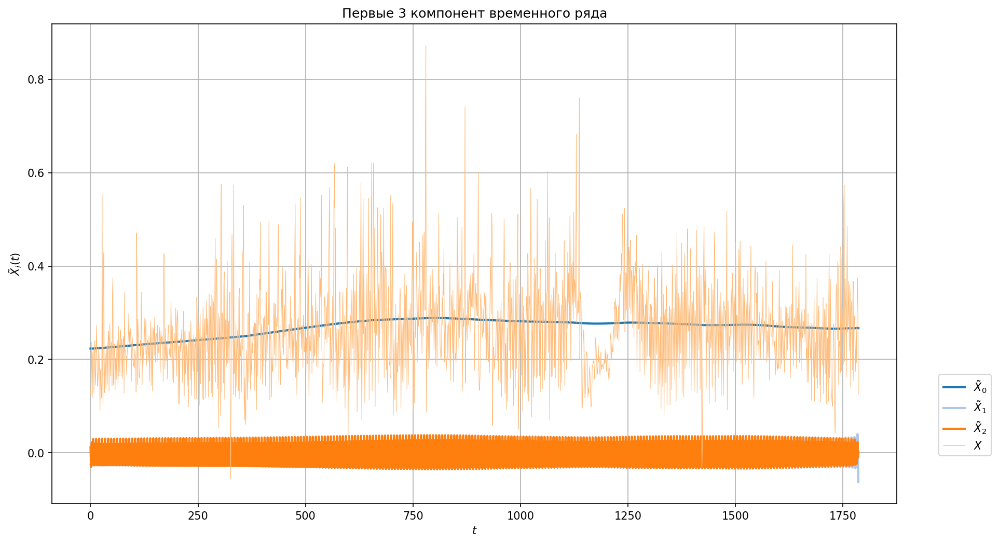

In [26]:
ssa.pict_components(3)

    Наблюдаем шум, компоненты Х1 и Х2, с периодичностью в день, и тренд, компонента Х0.

In [27]:
# фиксирую тренд и шум
ts_components['шум №1'] = {'X' : ssa.Xi_ts[1]} # шум №1
ts_components['шум №2'] = {'X' : ssa.Xi_ts[2]} # шум №2
ts_components['тренд'] = {'X' : ssa.Xi_ts[0]} # тренд

    Таким образом, зафиксировали тренд, сезонность с периодичностью год, месяц, неделя и шум.

In [28]:
# фиксирую остаток временного ряда от вычитания найденных компонент
ts_components['остаток'] = {'X' : ts_subtracting_components(ts, ts_components)}

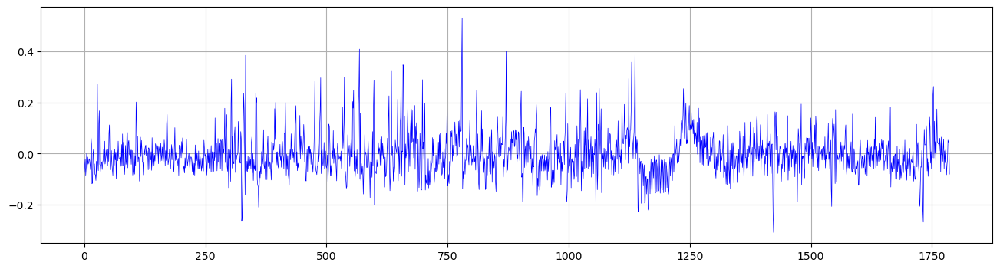

In [29]:
# рисую остатки
plt.figure(figsize=(16, 4))
plt.plot(ts_components['остаток']['X'], color='blue', lw = .5)
plt.grid()
plt.show()

    Выводы:
    1. исследуемый временной ряд имеет недельную, месячную и годовую цикличности
    2. тренд прослеживается слабо - начало и конец компоненты тренда практически на одном уровне
    3. наблюдаются большое количество шумовых компонент
    4. методом Singular Spectrum Analysis было выделено 9 компонент (2 недельных, 2 месячных, 2 годовых, 2 шумовых , тренд) и остаток от вычитания из исходного ряда выделенных 9 компонентов

* [Содержание](#Table-Of-Contents)

<a id="Stationarity"></a>
# 4.2 Стационарность.

    Проверю ряд на стационарность, т.е. попытаюсь понять, насколько поведение ряда устойчиво во времени:
    1. построю график скользящего среднего и скользящего стандартного отклонения
    2. проведу тест Дики-Фуллера (ADF)

In [30]:
def test_stationarity(ts):
    """ Проверка стационарности временного ряда """
    
    # построю график скользящего среднего и скользящего стандартного отклонения
    plt.figure(figsize = (16, 4))
    plt.plot(pd.DataFrame(ts), color = 'blue', lw = .5, label = 'истинные значения')
    plt.plot(pd.DataFrame(ts).rolling(window = 360).mean(), color = 'red', label = 'скользящее среднее')
    plt.plot(pd.DataFrame(ts).rolling(window = 360).std(), color = 'orange', label = 'скользящее стд.отклонение')
    plt.title('Скользящее среднее и стандартное отклонение')
    plt.xlabel('Наблюдение')
    plt.ylabel('Нормализованное значение')
    plt.grid()
    plt.legend()
    plt.show()
    
    # проведу тест Дики-Фуллера (ADF)
    result = adfuller(ts)
    print(f'ADF-статистика: {result[0]}')
    print(f'P-значение: {result[1]}')
    print('Критические значения:')
    for key, value in result[4].items():
        print(f'  {key}: {value}')

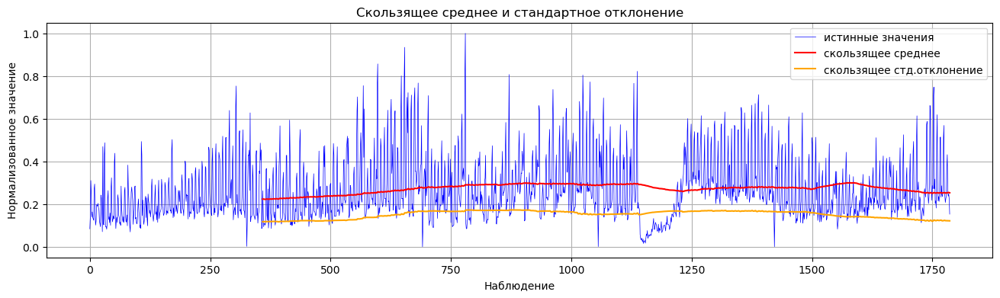

ADF-статистика: -4.330305829921666
P-значение: 0.0003934902742958564
Критические значения:
  1%: -3.4340603886571697
  5%: -2.863178930152895
  10%: -2.5676425164313974


In [31]:
# исходный временной ряд
test_stationarity(ts)

    Наблюдаем, что скользящее среднее и стандартное отклонение приблизительно горизонтальны. P-значение ниже порога 0,05, а статистика ADF близка к критическим значениям. Следовательно, временной ряд стационарен.

* [Содержание](#Table-Of-Contents)

<a id="TS-Modeling-Forecasting"></a>
# 5. Моделирование и прогнозирование временного ряда

<a id="ARIMA"></a>
# 5.1. Модель ARIMA

    Для моделирования будем использовать модель ARIMA.
    Чтобы построить модель нам нужно знать ее порядок, состоящий из 3-х параметров:
        p — порядок компоненты AR
        d — порядок интегрированного ряда
        q — порядок компонетны MA
    Параметр d есть и он равет 0 (ряд стационарный), осталось определить p и q. 
    Для их определения нам надо изучить авторкорреляционную(ACF) и частично автокорреляционную(PACF) функции для ряда первых разностей.
    ACF поможет нам определить q, т. к. по ее коррелограмме можно определить количество автокорреляционных коэффициентов сильно отличных от 0 в модели MA
    PACF поможет нам определить p, т. к. по ее коррелограмме можно определить максимальный номер коэффициента сильно отличный от 0 в модели AR.

In [32]:
# глубина прогноза
n_predictions = 90

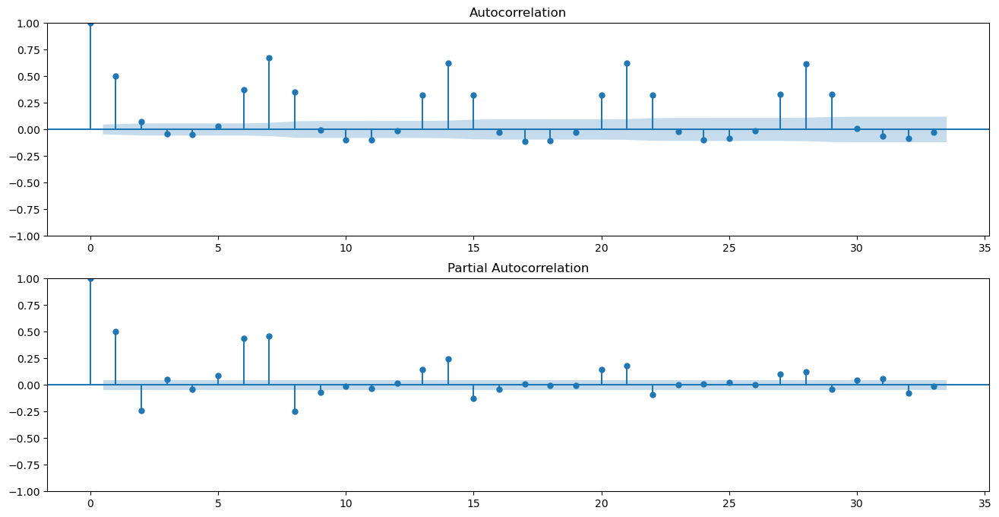

In [33]:
# автокорреляция и частичная автокорреляция
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(211)
fig = plot_acf(ts, ax=ax1)
ax2 = fig.add_subplot(212)
fig = plot_pacf(ts, method='ywm', ax=ax2)

In [34]:
# параметры модели ARIMA
p = 60 # PACF
d = 0  # стационарный ряд
q = 3  # ACF

In [35]:
%%time

# обучаю модель
ARIMA_result = ARIMA(ts, order=(p, d, q)).fit()

/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


CPU times: user 11min 52s, sys: 6min 44s, total: 18min 37s
Wall time: 4min 38s


In [36]:
print(ARIMA_result.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1787
Model:                ARIMA(60, 0, 3)   Log Likelihood                1921.001
Date:                Mon, 09 Feb 2026   AIC                          -3712.001
Time:                        12:51:12   BIC                          -3355.262
Sample:                             0   HQIC                         -3580.267
                               - 1787                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2619      0.021     12.238      0.000       0.220       0.304
ar.L1          0.1023      0.371      0.276      0.783      -0.624       0.829
ar.L2          0.0903      0.371      0.244      0.8

In [37]:
# проверю остатки модели на соответствие «белому шуму», а также проанализирую коррелограму остатков
q_test = acf(ARIMA_result.resid, qstat = True)
print(pd.DataFrame({'Q-stat': q_test[1], 'p-value': q_test[2]}))

      Q-stat   p-value
0   0.000026  0.995931
1   0.026244  0.986964
2   0.026997  0.998830
3   0.028702  0.999898
4   0.261822  0.998300
5   0.503144  0.997800
6   0.541648  0.999279
7   0.986883  0.998330
8   0.988717  0.999463
9   1.051015  0.999784
10  1.065124  0.999931
11  1.415962  0.999904
12  1.416763  0.999969
13  1.557643  0.999982
14  1.612598  0.999993
15  1.614676  0.999998
16  1.615803  0.999999
17  1.647846  1.000000
18  1.663591  1.000000
19  1.700231  1.000000
20  1.764171  1.000000
21  1.800087  1.000000
22  1.804102  1.000000
23  2.046754  1.000000
24  2.210468  1.000000
25  2.277697  1.000000
26  2.507354  1.000000
27  2.574730  1.000000
28  2.603326  1.000000
29  4.581239  1.000000
30  4.913198  1.000000
31  4.954160  1.000000


    P-значение больше порога в 0.05, поэтому предполагю, что остатки нестационарны, т.е. похожи на случайные значения или "белый шум".

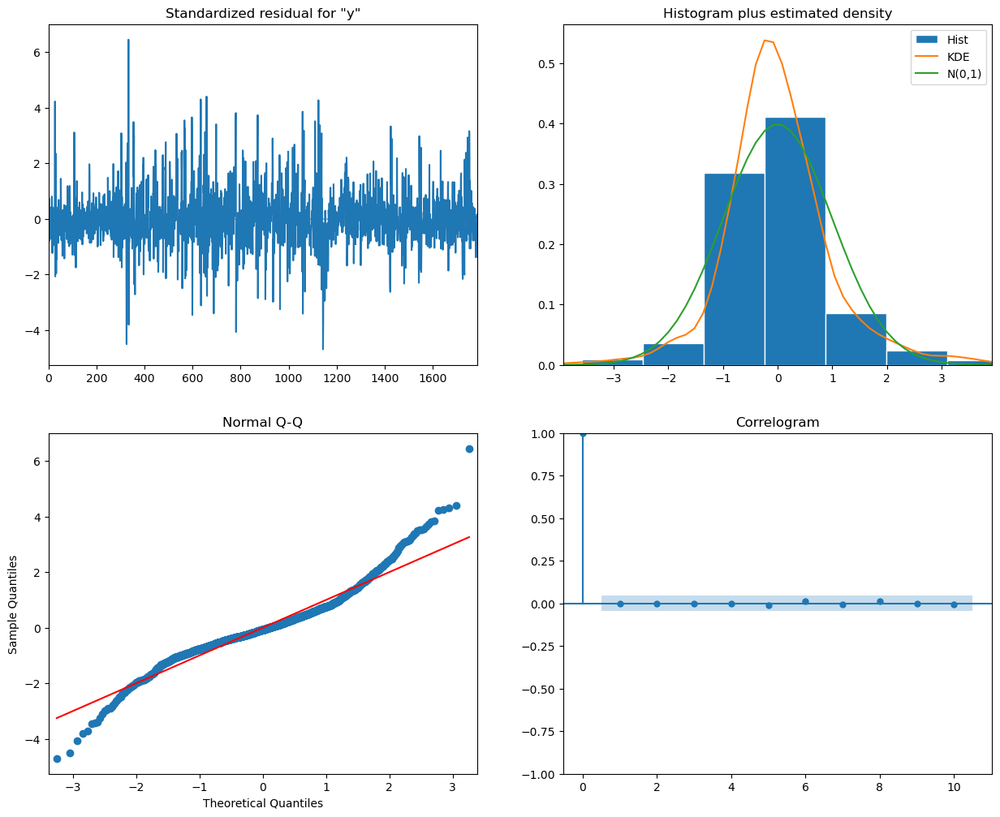

In [38]:
ARIMA_result.plot_diagnostics(figsize = (15, 12))
plt.show()

    Остатки модели распределены с нулевым средним, о чем говорит близость линии KDE к линии нормального распределения N (среднее 0 и стандартное отклонение 1).
    Остатки с течением времени (верхний левый график) не показывают явной сезонности и кажутся белыми шумами. Это подтверждается графиком автокорреляции (внизу справа), который показывает, что остатки временных рядов имеют низкую корреляцию с запаздывающими данными.

In [39]:
# строю прогноз
pred = ARIMA_result.predict(len(ts) - n_predictions, len(ts)-1)

In [40]:
# считаю ошибки прогноза
error = [ts[-n_predictions + i] - pred[i] for i in range(n_predictions)]

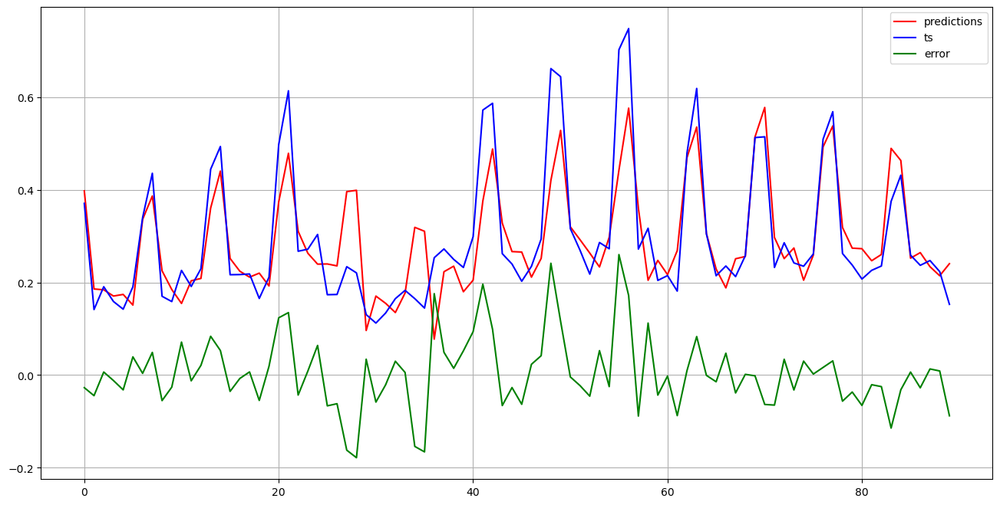

In [41]:
# рисую
plt.figure(figsize=(16,8))
plt.plot(pred, color='red', label='predictions')
plt.plot(ts[-n_predictions:], color='blue', label='ts')
plt.plot(error, color='green', label='error')
plt.grid()
plt.legend()
plt.show()

In [42]:
# метрики качества модели и прогноза 
print('R^2: %1.2f' % r2_score(ts[-n_predictions:], pred[:]))
print(f'sqrt(MSE) на норм. данных: {np.sqrt(mean_squared_error(ts[-n_predictions:], pred[:]))}')

R^2: 0.71
sqrt(MSE) на норм. данных: 0.07887944036395445


    Учитывая полученное значение коэффициента детерминации, можно сказать, что модель объясняет 71% дисперсии значений временного ряда.
    Ошибка на нормализованных данных временного ряда находится в пределах 8% (показатель RMSE = 0,079).

/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


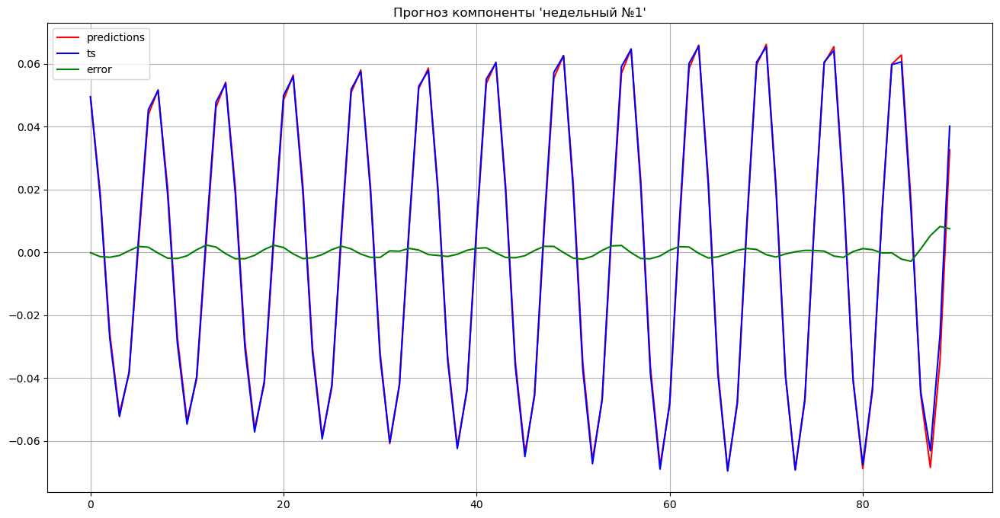

R^2: 1.00
RMSE на норм.данных: 0.0018568924210858795


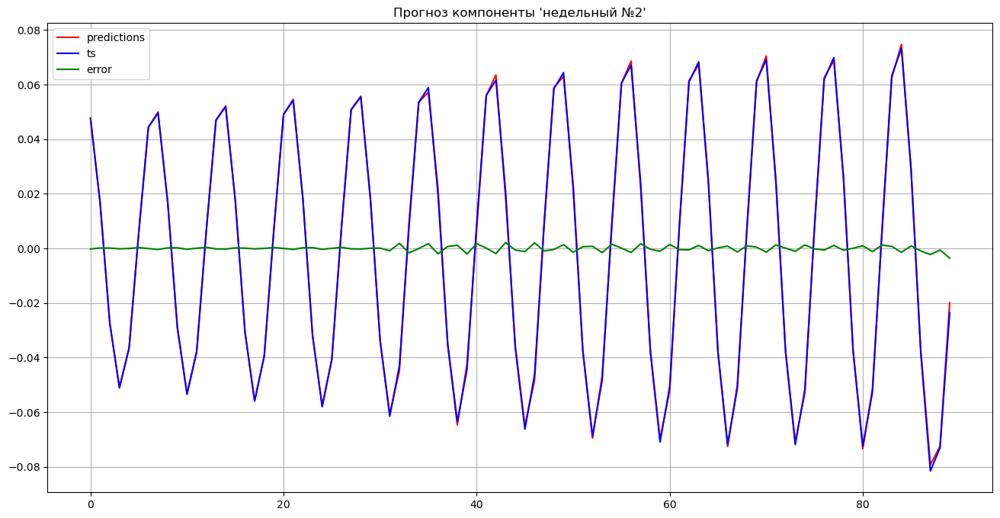

R^2: 1.00
RMSE на норм.данных: 0.0010458303579750849


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


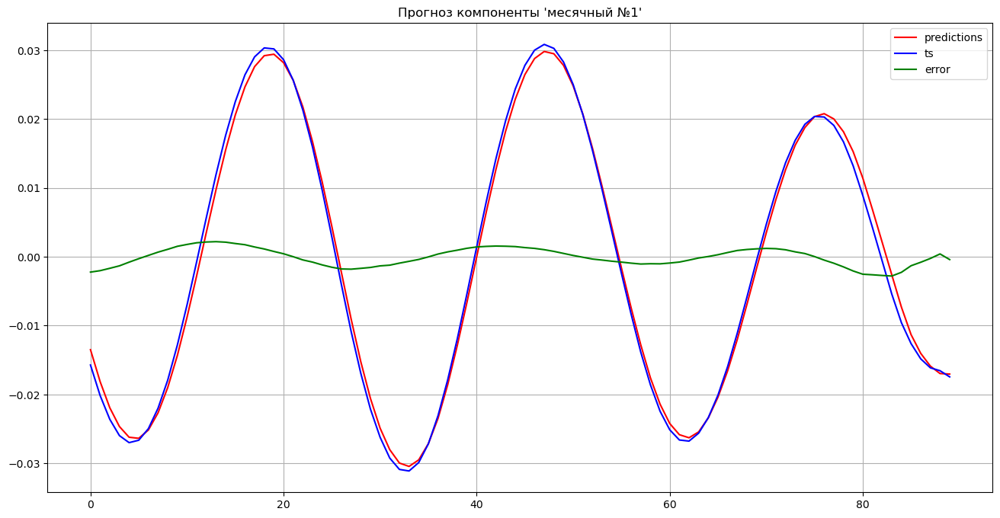

R^2: 1.00
RMSE на норм.данных: 0.0012915422402395578


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


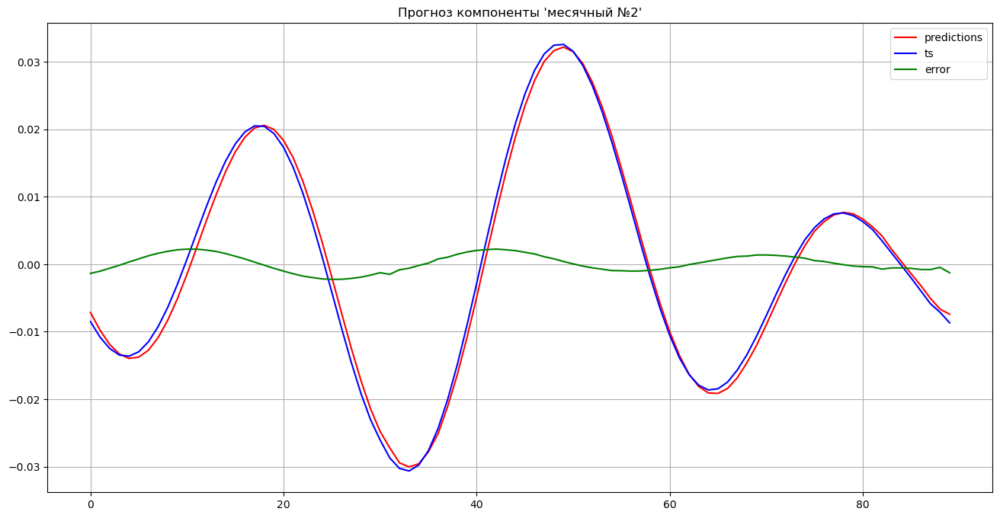

R^2: 0.99
RMSE на норм.данных: 0.001256977868552532


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


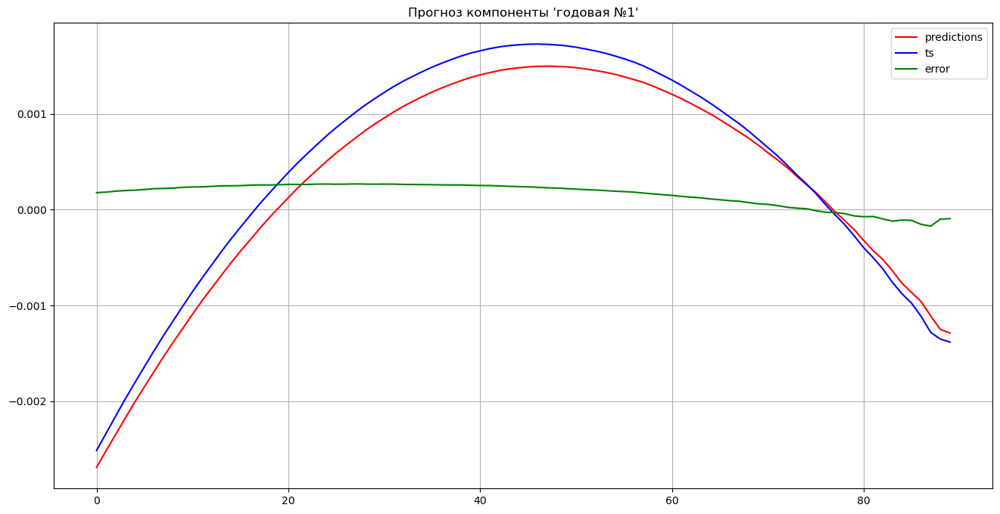

R^2: 0.97
RMSE на норм.данных: 0.00020049357665107622


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


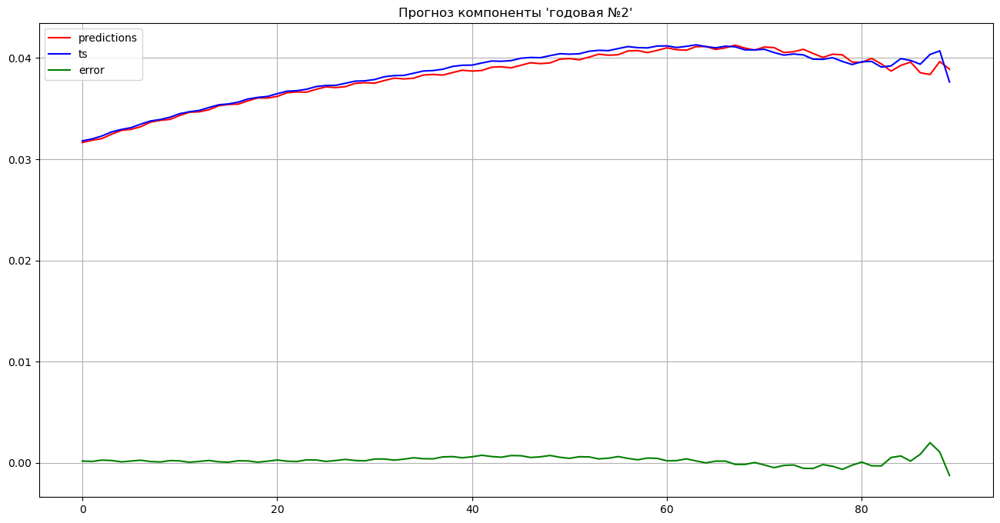

R^2: 0.97
RMSE на норм.данных: 0.0004663396591285193


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


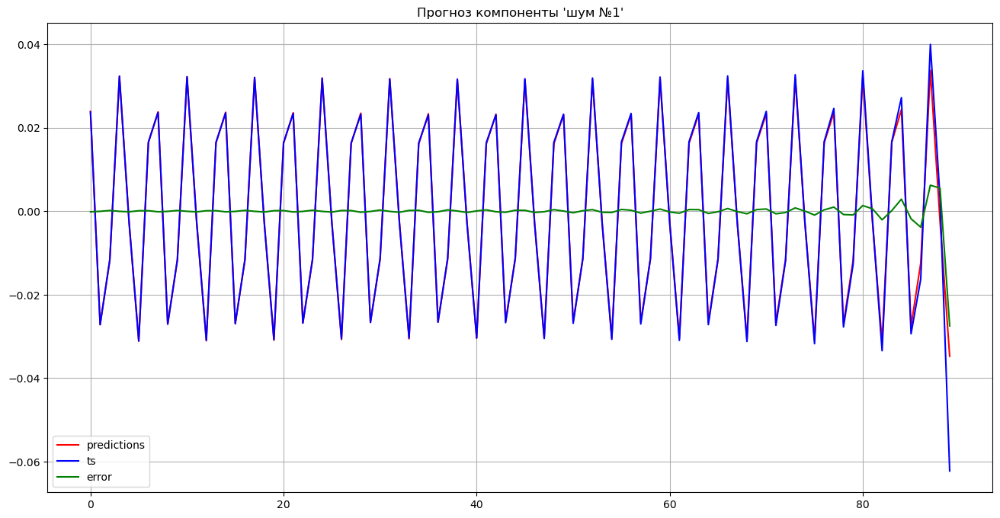

R^2: 0.98
RMSE на норм.данных: 0.0031044899564384564


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


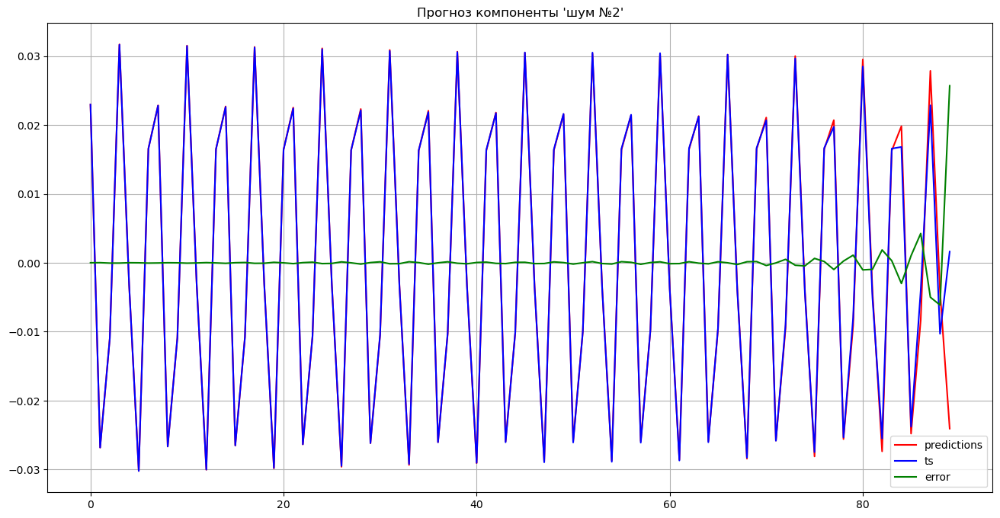

R^2: 0.98
RMSE на норм.данных: 0.0029074208620480197


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


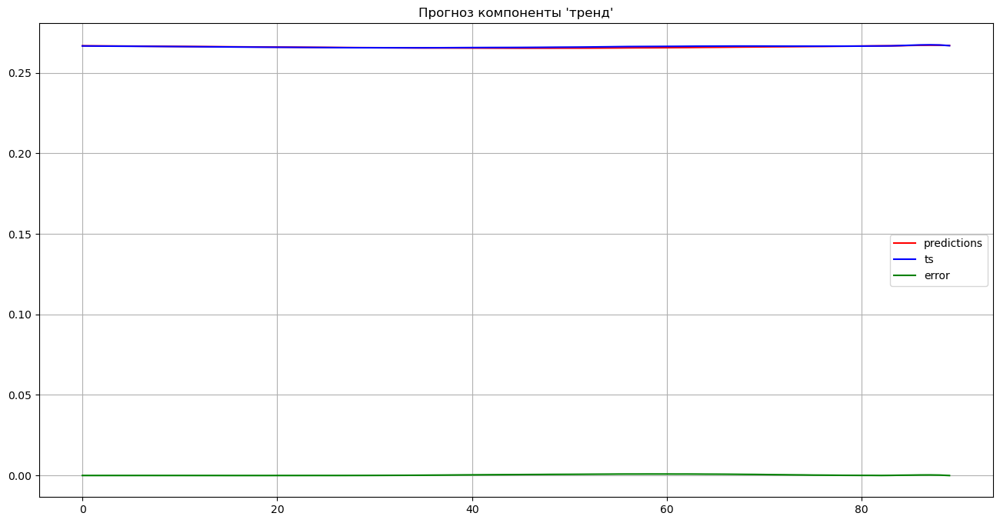

R^2: 0.24
RMSE на норм.данных: 0.0003988853222282212


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


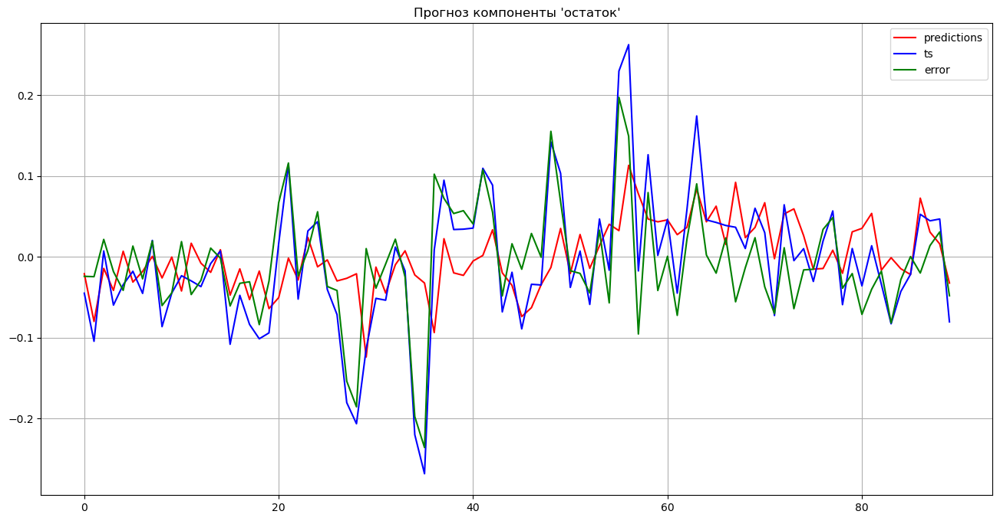

R^2: 0.33
RMSE на норм.данных: 0.06806272421799862
CPU times: user 2h 22min 20s, sys: 1h 27min 44s, total: 3h 50min 5s
Wall time: 57min 3s


In [43]:
%%time

# выполню прогноз по каждой из составляющих ряда и по сумме составляющих
# тут сохраню сумму "n_predictions" предсказанных значений всех составляющих
summ_pred_ARIMA = np.zeros(n_predictions)

for key in ts_components.keys(): 
    # берем очередную сохраненную составляющую
    # обучаем модель
    ARIMA_result = ARIMA(ts_components[key]['X'], order = (p, d, q)).fit()
    # прогноз по составляющей ряда
    predictions = ARIMA_result.predict(len(ts_components[key]['X']) - n_predictions, \
                                       len(ts_components[key]['X']) - 1)
    # ошибка прогноза
    error = [ts_components[key]['X'][-n_predictions + i] - predictions[i] for i in range(n_predictions)]
    # суммирую прогнозы
    summ_pred_ARIMA = summ_pred_ARIMA + predictions
    # сохраняю прогноз
    ts_components[key]['pred_ARIMA'] = predictions
    ts_components[key]['model_ARIMA'] = key + '_days_ARIMA.pkl'
    ARIMA_result.save(path_to_local_data + '/models/' + ts_components[key]['model_ARIMA'])
    # рисую
    plt.figure(figsize = (16, 8))
    plt.plot(predictions, color = 'red', label = 'predictions')
    plt.plot(ts_components[key]['X'][-n_predictions:], color = 'blue', label = 'ts')
    plt.plot(error, color = 'green', label = 'error')
    plt.title(f"Прогноз компоненты '{key}'")
    plt.grid()
    plt.legend()
    plt.show()
    # печатаю метрики
    print('R^2: %1.2f' % r2_score(ts_components[key]['X'][-n_predictions:], predictions))
    print(f"RMSE на норм.данных: {np.sqrt(mean_squared_error(ts_components[key]['X'][-n_predictions:], predictions))}")

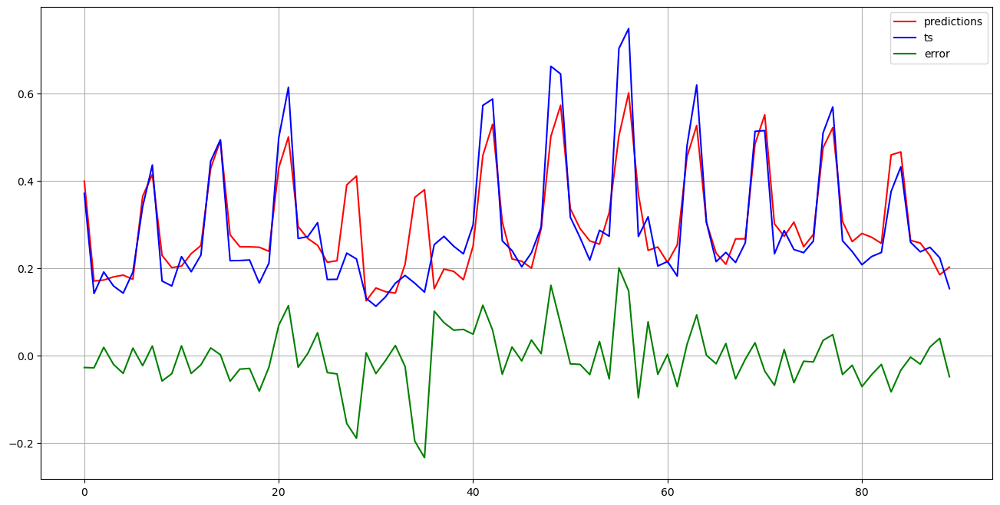

In [44]:
# рисуем прогноз и ошибку по сумме прогнозов компонент ряда
# ошибка по сумме прогнозов компонент
error = [ts[-n_predictions + i] - summ_pred_ARIMA[i] for i in range(n_predictions)]
# рисую
plt.figure(figsize = (16, 8))
plt.plot(summ_pred_ARIMA, color = 'red', label = 'predictions')
plt.plot(ts[-n_predictions:], color = 'blue', label = 'ts')
plt.plot(error, color = 'green', label = 'error')
plt.legend()
plt.grid()
plt.show()

In [45]:
# печатаю метрики модели и прогноза по сумме прогнозов компонент ряда
print('R^2: %1.2f' % r2_score(ts[-n_predictions:], summ_pred_ARIMA))
print(f'RMSE на норм. данных: {np.sqrt(mean_squared_error(ts[-n_predictions:], summ_pred_ARIMA))}')

R^2: 0.78
RMSE на норм. данных: 0.06872711792538284


    Предсказание ряда моделью ARIMA:
    - исходный ряд без разделения на компоненты - rmse 0.079, r^2 0.71
    - предсказание отдельно каждой из компонент, суммирование предсказаний - rmse 0.069, r^2 0.78
    - определяющий вклад в ошибку прогноза вносит компонента "остаток"
    - наблюдаю, что разбиение ряда на компоненты с последующим прогнозом как сумма прогнозов компонент дает лучший результат, и в смысле обобщающей способности модели (r^2) и в смысле качества прогноза (rmse)

* [Содержание](#Table-Of-Contents)

<a id="NN"></a>
# 5.2 Применение искусственных нейронных сетей

In [46]:
# глубина прогноза
n_predictions = 90

Данные для обучения: фичи - (1637, 60, 1), метки - (1637,)


I0000 00:00:1770634096.698089  465956 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1007 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:01:00.0, compute capability: 8.6
/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
2026-02-09 13:48:17.687618: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 91700


Данные для тестирования: фичи - (90, 60, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


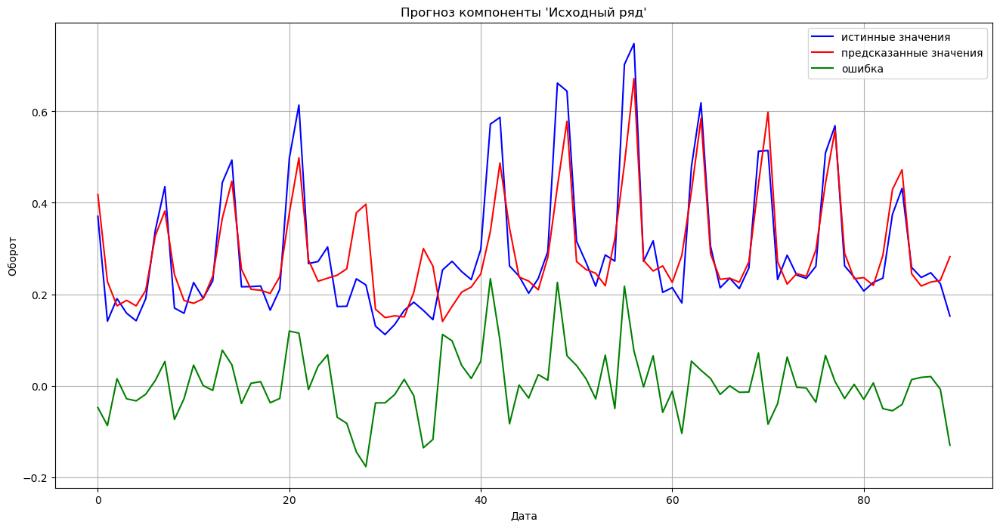

R^2: 0.76
RMSE на норм. данных: 0.07161020099351625
CPU times: user 37.6 s, sys: 1.65 s, total: 39.3 s
Wall time: 30.1 s


In [47]:
%%time

# используя искусственную нейронную сеть, предскажем значения по данным исходного временного ряда
L = 60 # окно анализа

# формируем обучающий набор
features, labels = ts_feature_preparation(ts, window = L, n_predictions = n_predictions)
# обучение модели
model, _ = model_fit(lstm_model(L, (features.shape[1], 1), summary = False), \
                        features, labels, epochs = 50, batch_size = 16, validation_split = .2, verbose = 0)
# формируем тестовый набор - "n_predictions" последних значений ряда
test_features, test_labels = test_feature_preparation(ts, L, n_predictions)
# получаем предсказание
predictions = test_predict(model, test_features)
# ошибка прогноза
error = [ts[-n_predictions + i] - predictions[i] for i in range(n_predictions)]
# рисуем ошибку предсказания
pict_predict(predictions, test_labels, error, 0, 'Исходный ряд')

    Учитывая полученное значение коэффициента детерминации, можно сказать, что модель объясняет 80% дисперсии значений временного ряда.
    Ошибка на нормализованных данных временного ряда находится в пределах 7% (показатель RMSE = 0,065).

Данные для обучения: фичи - (1637, 60, 1), метки - (1637,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 60, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


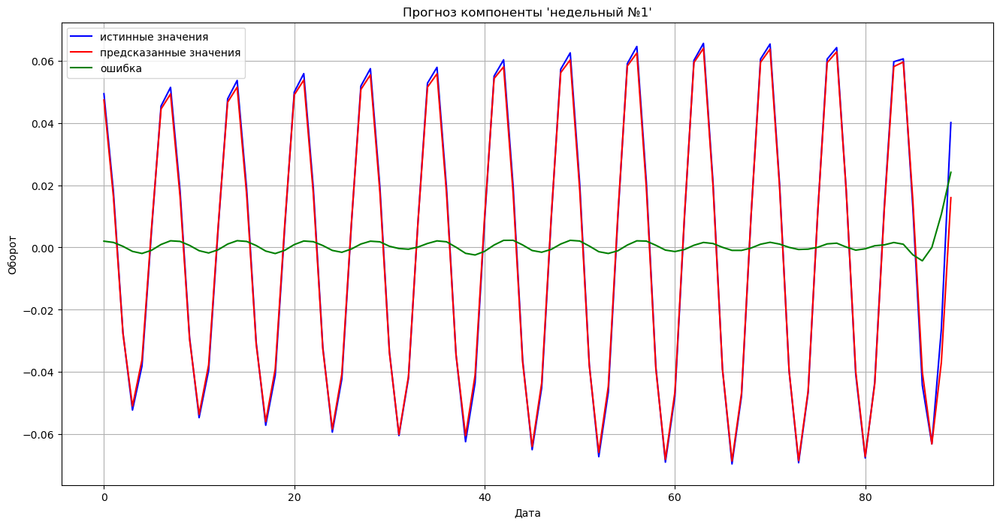

R^2: 1.00
RMSE на норм. данных: 0.0031134698753557026
Данные для обучения: фичи - (1637, 60, 1), метки - (1637,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 60, 1), метки - 90


1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/stepWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x7001442aa2a0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


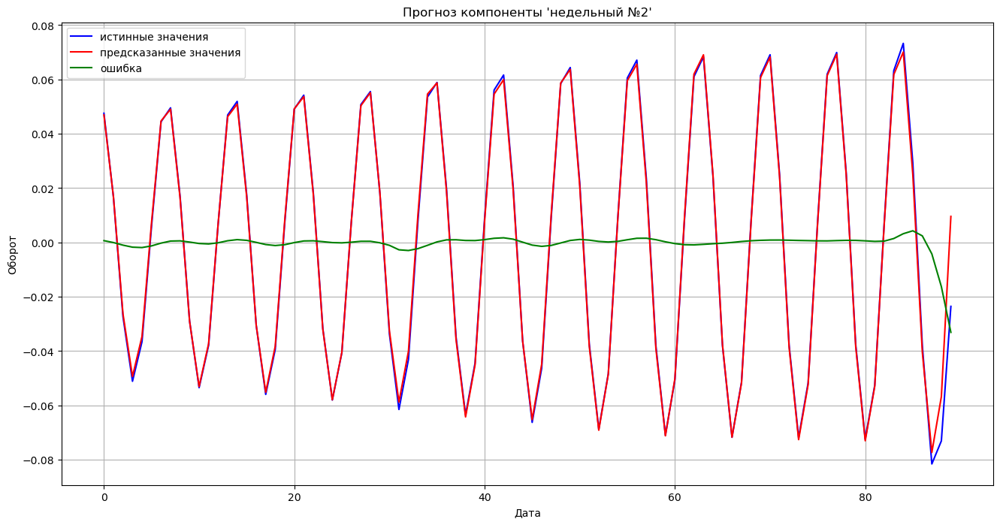

R^2: 0.99
RMSE на норм. данных: 0.004070367561949376
Данные для обучения: фичи - (1637, 60, 1), метки - (1637,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 60, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


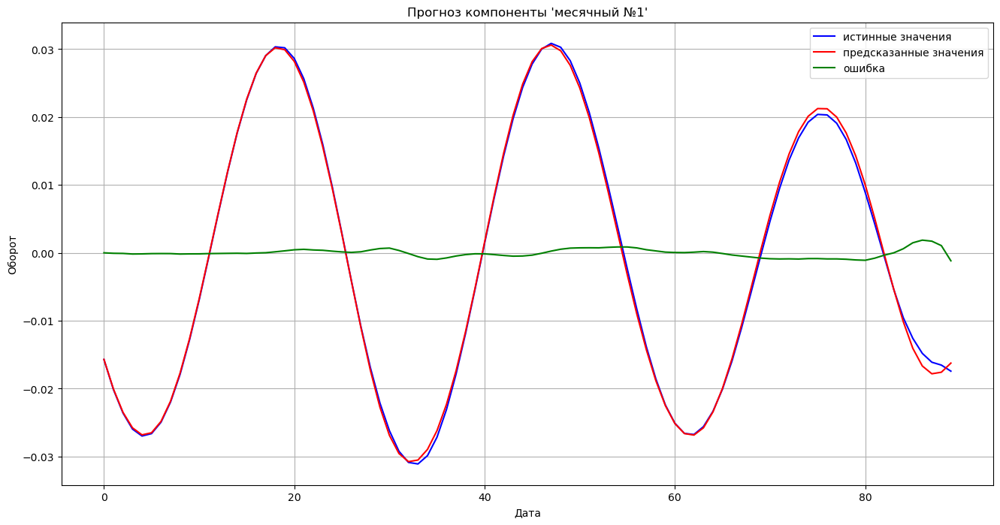

R^2: 1.00
RMSE на норм. данных: 0.0006217655769925419
Данные для обучения: фичи - (1637, 60, 1), метки - (1637,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 60, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


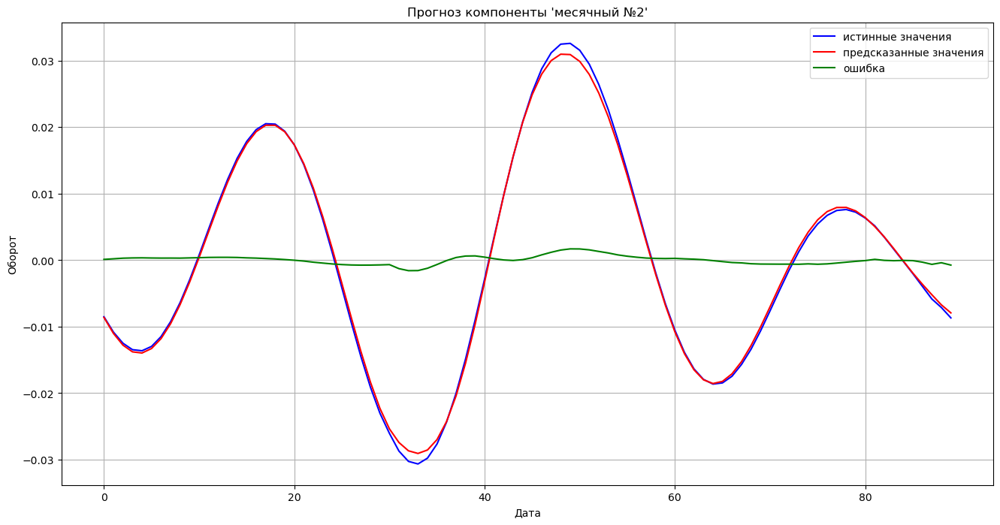

R^2: 1.00
RMSE на норм. данных: 0.0006443988232450296
Данные для обучения: фичи - (1337, 360, 1), метки - (1337,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 360, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


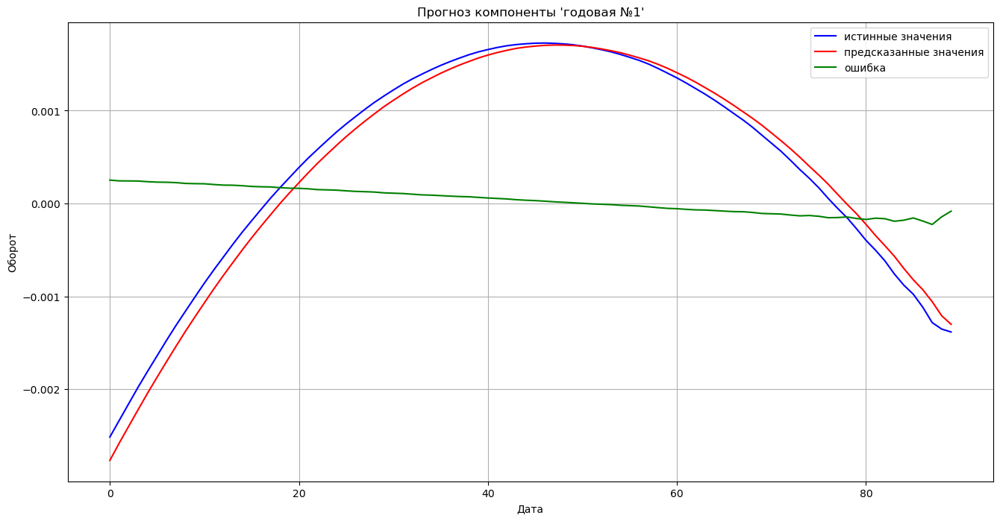

R^2: 0.99
RMSE на норм. данных: 0.00013903690849752424
Данные для обучения: фичи - (1337, 360, 1), метки - (1337,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 360, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


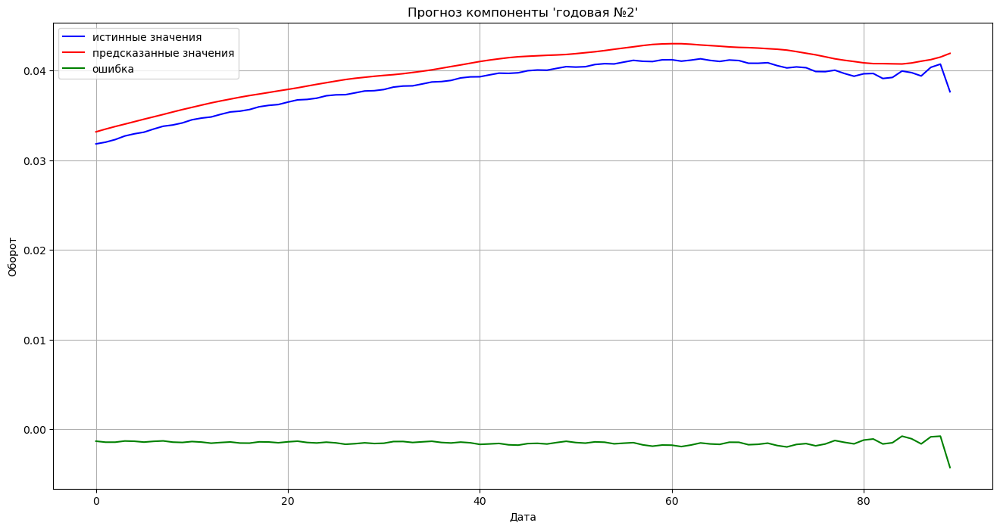

R^2: 0.63
RMSE на норм. данных: 0.001588743486703094
Данные для обучения: фичи - (1337, 360, 1), метки - (1337,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 360, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


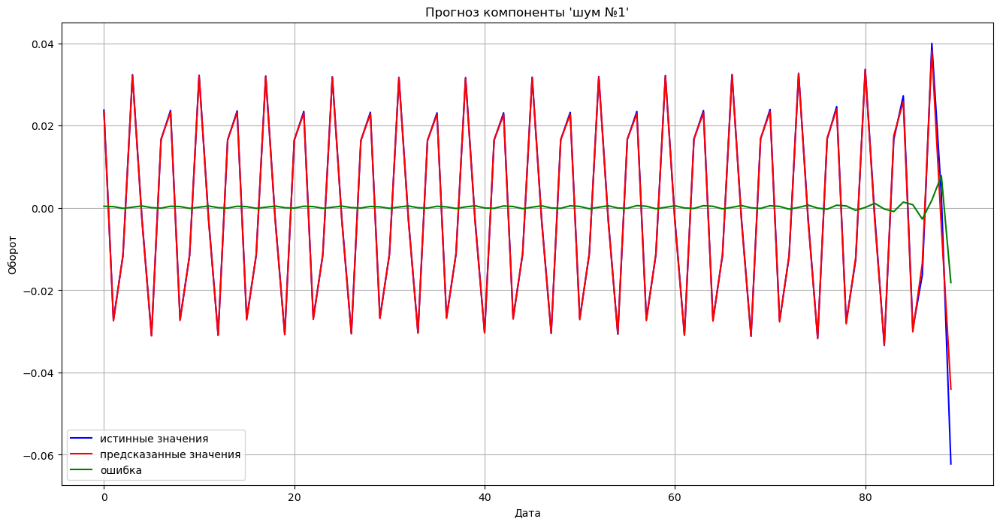

R^2: 0.99
RMSE на норм. данных: 0.0021467027743917247
Данные для обучения: фичи - (1337, 360, 1), метки - (1337,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 360, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


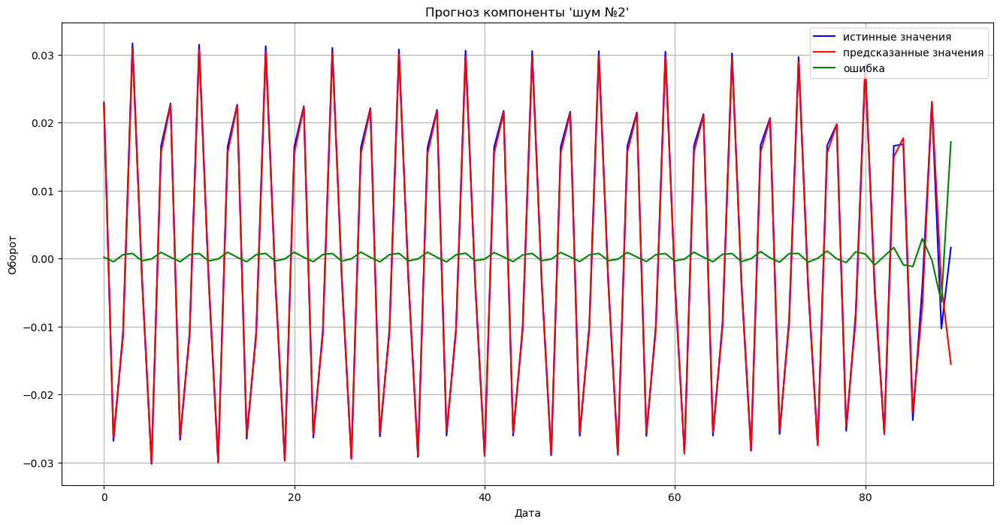

R^2: 0.99
RMSE на норм. данных: 0.0020433749133419695
Данные для обучения: фичи - (1337, 360, 1), метки - (1337,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 360, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


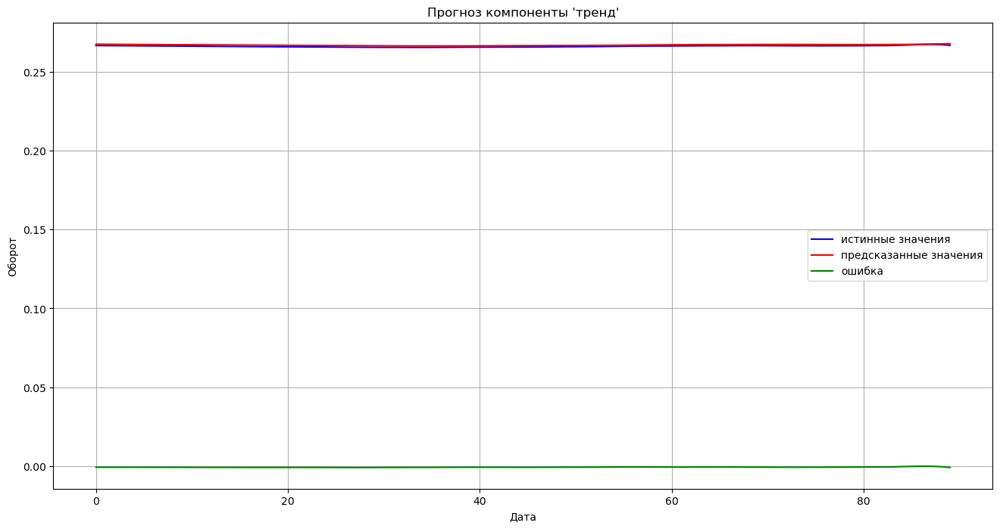

R^2: -2.22
RMSE на норм. данных: 0.0008196229826673497
Данные для обучения: фичи - (1427, 270, 1), метки - (1427,)


/home/mark/miniconda3/envs/tf20/lib/python3.13/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Данные для тестирования: фичи - (90, 270, 1), метки - 90
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


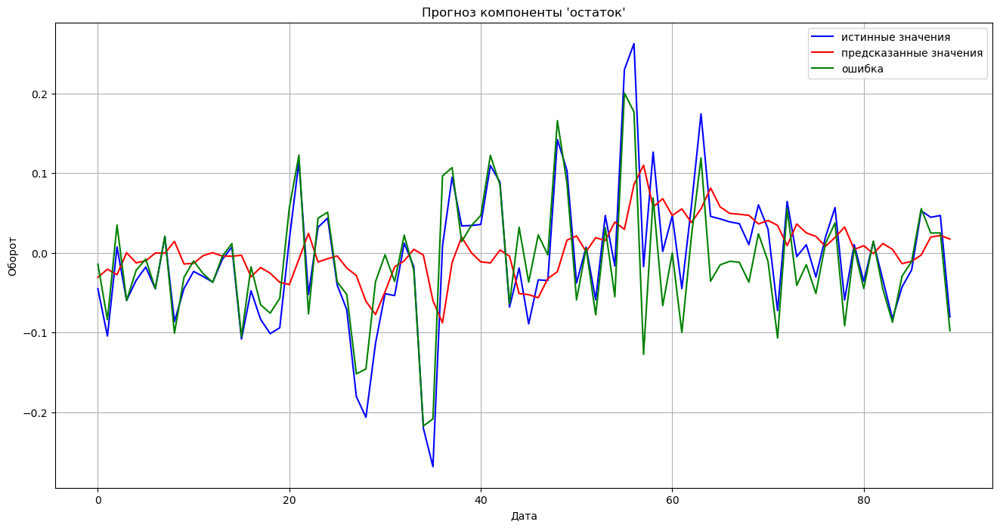

R^2: 0.19
RMSE на норм. данных: 0.07501071093489668
CPU times: user 7min 30s, sys: 6.63 s, total: 7min 37s
Wall time: 7min 1s


In [48]:
%%time

# используя искусственную нейронную сеть, предскажем значения по каждой из найденных составляющих исходного 
# временного ряда, далее, просуммируем предсказания всех моделей и сравним со значениями исходного временного ряда

# тут сохраним сумму "n_predictions" предсказанных значений всех составляющих
summ_pred = np.zeros(n_predictions)

for key in ts_components.keys():  
    # берем очередную сохраненную составляющую
    if key in ['тренд', 'годовая №1', 'годовая №2', 'шум №1', 'шум №2']:
        L = 360 # окно анализа для составляющих большой периодичности
    elif key in ['остаток']:
        L = 270
    else:
        L = 60 # окно анализа для составляющих малой периодичности
    # формируем обучающий набор
    features, labels = \
                ts_feature_preparation(ts_components[key]['X'], window = L, n_predictions = n_predictions)
    # обучение модели
    model, _ = model_fit(lstm_model(L, (features.shape[1], 1), summary = False), \
                         features, labels, epochs = 50, batch_size = 16, validation_split = .2, verbose = 0)
    # формируем тестовый набор - "n_predictions" последних значений ряда
    test_features, test_labels = test_feature_preparation(ts_components[key]['X'], L, n_predictions)
    # получаем предсказание
    predictions = test_predict(model, test_features)
    # ошибка прогноза
    error = [ts_components[key]['X'][-n_predictions + i] - predictions[i] for i in range(n_predictions)]
    # фиксируем предсказание по составляющей
    ts_components[key]['pred_NN'] = predictions.reshape(summ_pred.shape)
    ts_components[key]['model_NN'] = key + '_days_NN.h5'
    ts_components[key]['L_model_NN'] = L
    model.save(path_to_local_data + '/models/' + ts_components[key]['model_NN'])
    # суммируем предсказания по составляющим временного ряда
    summ_pred = summ_pred + predictions.reshape(summ_pred.shape)
    # рисуем ошибку предсказания
    pict_predict(predictions, test_labels, error, 0, key)

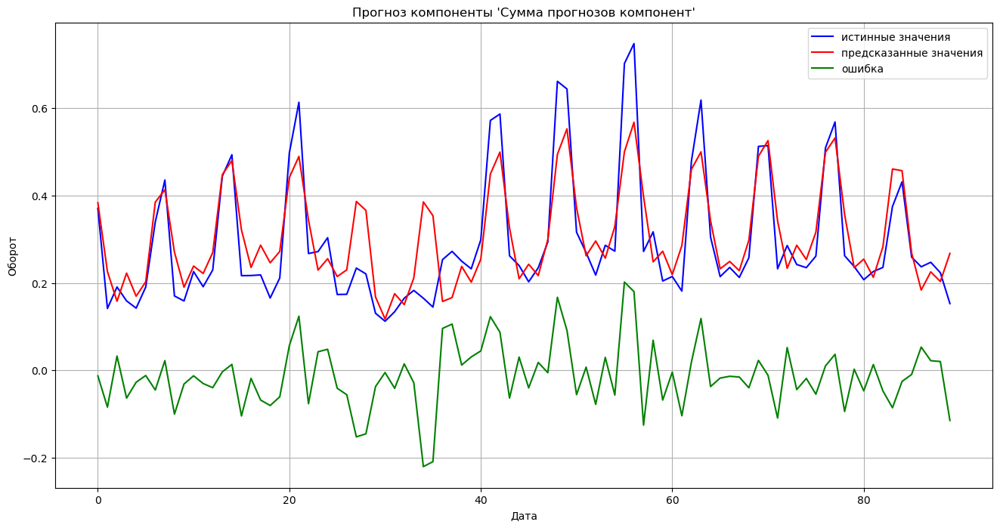

R^2: 0.73
RMSE на норм. данных: 0.07605268409064865


In [49]:
# рисуем прогноз и ошибку по сумме прогнозов компонент ряда
# ошибка по сумме прогнозов компонент
error = [ts[-n_predictions + i] - summ_pred[i] for i in range(n_predictions)]
# рисую
pict_predict(summ_pred, ts[-n_predictions:], error, 0, 'Сумма прогнозов компонент')

In [50]:
# сохраню результаты на всякий случай
# данные и предсказания составляющих временного ряда
with open('../results/ts_components_days.pkl',"wb") as file:
    pickle.dump(ts_components, file)

    Предсказание ряда LSTM-сетью:
    - исходный ряд без разделения на компоненты - rmse 0.065, r^2 0.8
    - предсказание отдельно каждой из компонент, суммирование предсказаний - rmse 0.076, r^2 0.73
    - определяющий вклад в ошибку прогноза вносит компонента "остаток"
    - наблюдаю, что разбиение ряда на компоненты с последующим прогнозом как сумма прогнозов компонент дает лучший результат, и в смысле обобщающей способности модели (r^2) и в смысле качества прогноза (rmse)

* [Содержание](#Table-Of-Contents)

<a id="TS-Modeling-Forecasting-Conclusion"></a>
# 6. Выводы по результатам вариантов решения задачи и выбор оптимального варианта

    Таким образом, имеем 4 варианта решения задачи прогнозирования продаж методом анализа истории продаж за период (временной ряд объемов продаж):
    - метод ARIMA - без разложения временного ряда на составляющие/ с разложением (SSA)
    - с применением искусственных нейронных сетей - без разложения временного ряда на составляющие/ с разложением (SSA)
    Для анализа и сравнения качества моделей использовались метрики:
    - r^2 (коэффициент детерминации) - как показатель обобщающей способности модели
    - rmse (среднеквадратическая ошибка) - как показатель точности прогноза (сравнение с имеющимися истинными данными)
    В результате проведенного эксперимента получены следующие результаты:
    - в1 (ARIMA, ряд целиком): rmse 0.079, r^2 0.71
    - в2 (ARIMA, по компонентам): rmse 0.069, r^2 0.78
    - в3 (LSTM, ряд целиком): rmse 0.065, r^2 0.8
    - в4 (LSTM, по компонентам): rmse 0.076, r^2 0.73
    Очевидно, что лучшие показатели метрик достигнуты в случае применения алгоритма ARIMA с предварительным разложением исходного временного ряда на компоненты.

    Проведу проверку качества прогнозирования на накопленных за последнее время данных, т.е. возьму модели, обученные на данных за период до 1/01/2022, и построю с их помощью прогноз на период с 1/01/2022 по 23/02/2022. Далее, посчитаю метрики по истинным данным, имеющимся за прогнозируемый период.
    При этом, методики ARIMA и LSTM буду применять к временному ряду, разложенному на компоненты.

In [51]:
# загружаю результаты обработки временного ряда - понадобятся для подготовки прогноза
with open('../results/ts_components_days.pkl',"rb") as file:
    ts_components = pickle.load(file)

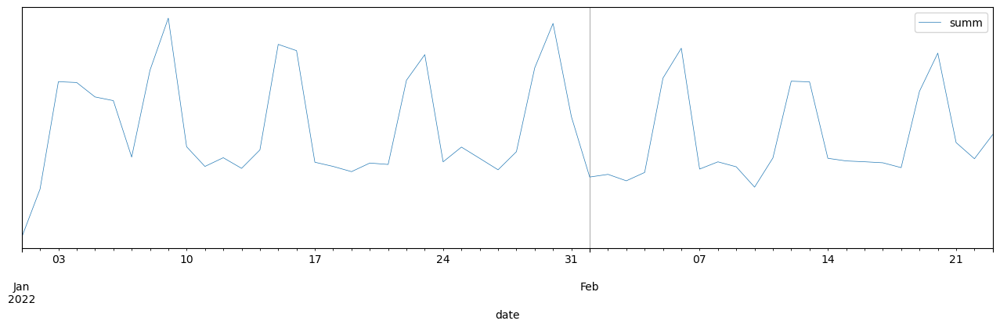

In [52]:
# загружаю данные по продажам за прогнозируемый период (для проверки)
df_CD_prov = pd.read_csv(path_to_local_data + '/data/ts_days_prov.csv', header = None, sep = ';', \
                         names = ['date', 'summ'])
# привожу данные к нужным типам
df_CD_prov['date'] = pd.to_datetime(df_CD_prov['date'], format = "%d.%m.%Y")
df_CD_prov['summ'] = df_CD_prov['summ'].astype('float64')
# установливаю дату в качестве индекса
df_CD_prov = df_CD_prov.set_index('date')
# рисую
df_CD_prov.plot(figsize = (16, 4), yticks = [], lw = .5)
plt.grid()
plt.show()

In [53]:
# проверочный временной ряд - продажи - по дням
ts_prov = df_CD_prov['summ'].copy()

In [54]:
# нормализуем проверочный ряд
ts_prov = scaler.transform(ts_prov.values.reshape(-1, 1)).reshape(1,-1)[0]
ts_prov.shape

(54,)

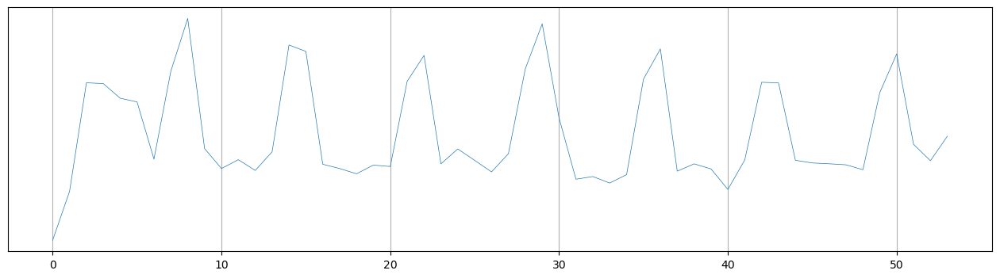

In [55]:
plt.figure(figsize = (16, 4))
plt.plot(ts_prov, lw = .5)
plt.yticks([])
plt.grid()
plt.show()

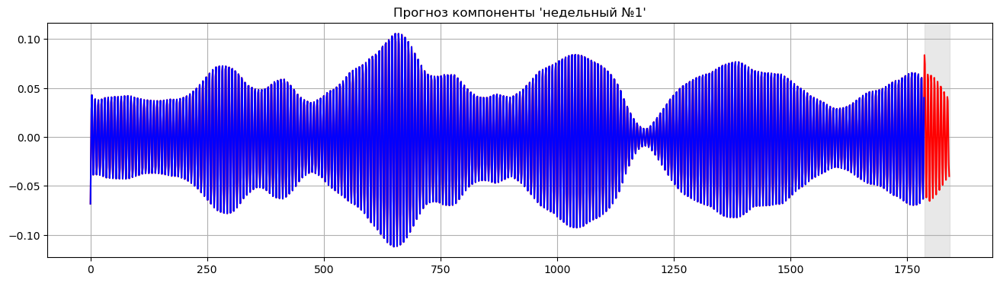

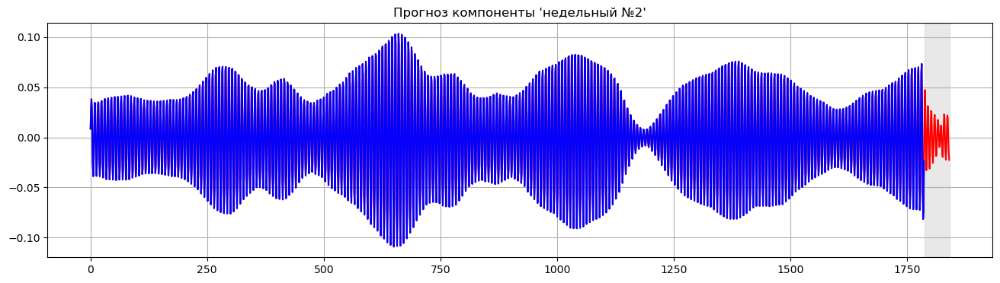

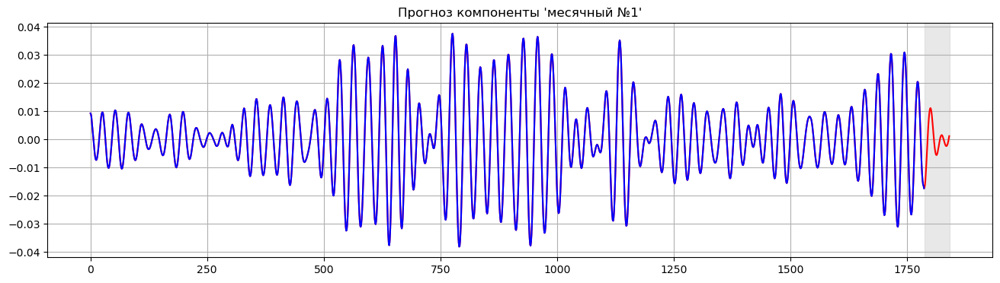

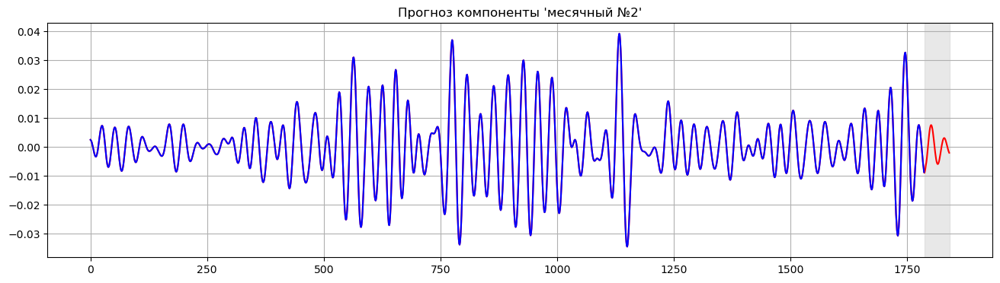

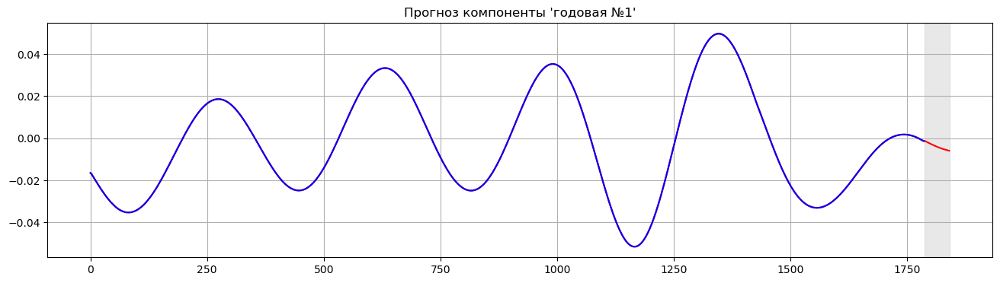

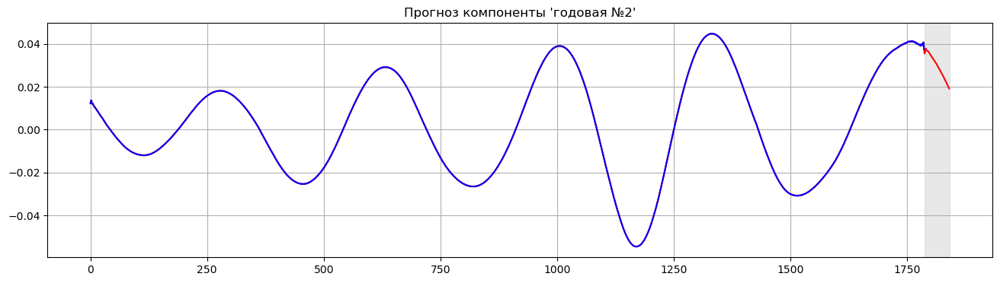

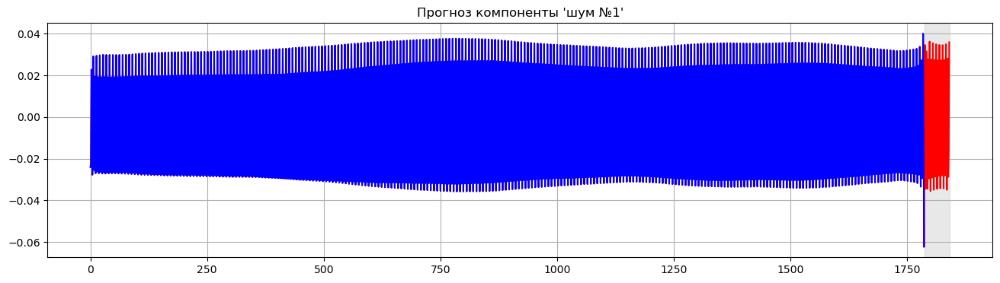

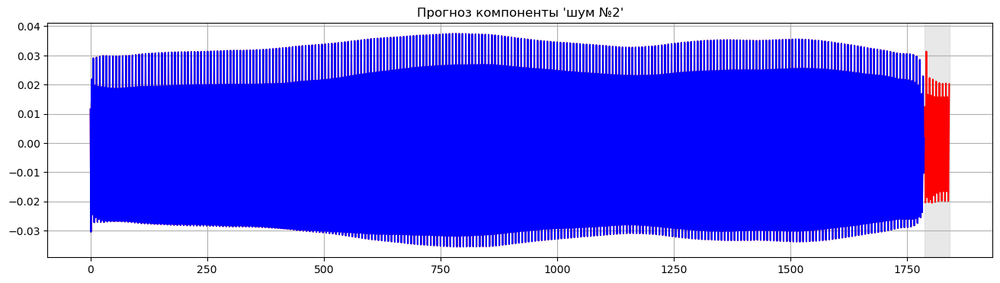

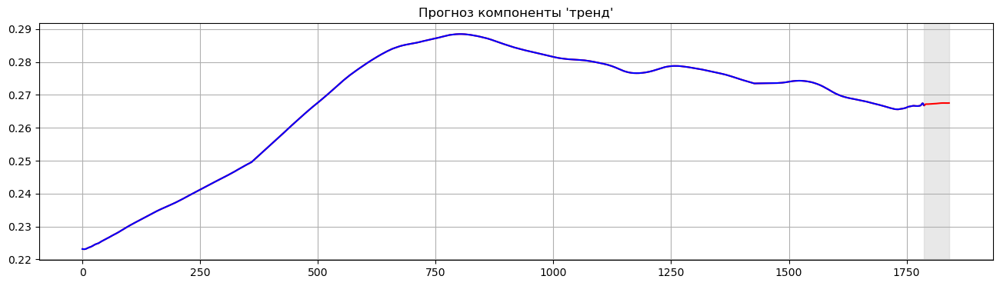

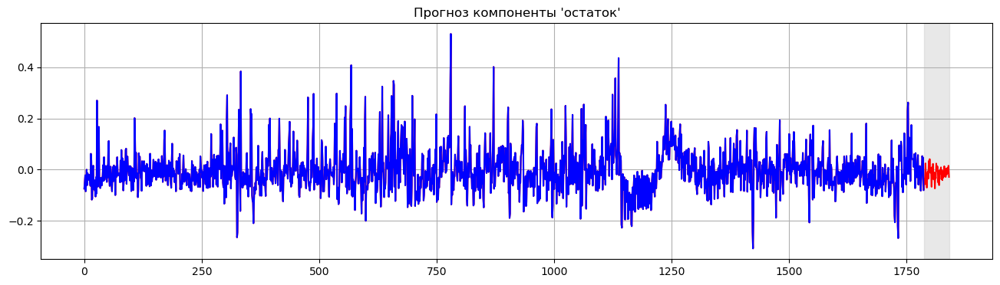

In [56]:
# прогноз ARIMA

n_predictions = ts_prov.shape[0]
summ_pred_ARIMA = np.zeros(n_predictions)

for key in ts_components.keys(): 
    # загружаю модель
    ARIMA_result = ARIMAResults.load(path_to_local_data + '/models/' + ts_components[key]['model_ARIMA'])
    # делаю прогноз
    predictions = ARIMA_result.predict(len(ts), len(ts) + n_predictions - 1)
    # суммирую прогнозы
    summ_pred_ARIMA = summ_pred_ARIMA + predictions
    # рисуем
    plt.figure(figsize = (16, 4))
    plt.plot(np.hstack([ts_components[key]['X'], predictions]), color = 'red')
    plt.plot(ts_components[key]['X'], color = 'blue')
    plt.title(f"Прогноз компоненты '{key}'")
    plt.axvspan(len(ts), len(np.hstack([ts_components[key]['X'], predictions])), alpha = 0.5, color = 'lightgrey')
    plt.grid()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

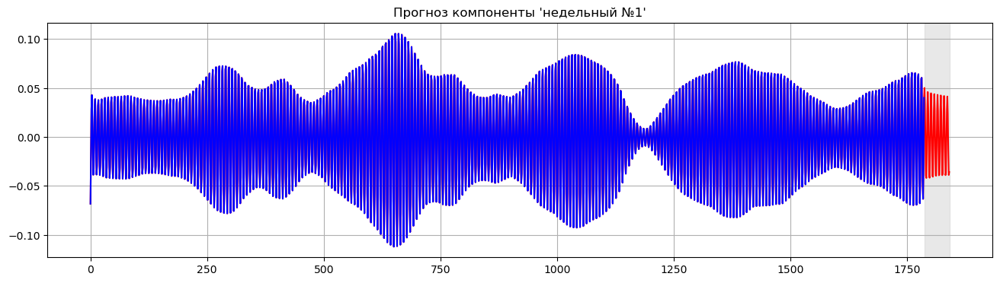

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

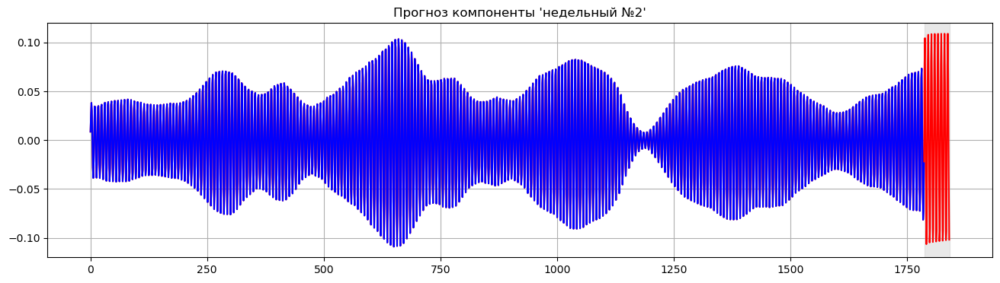

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

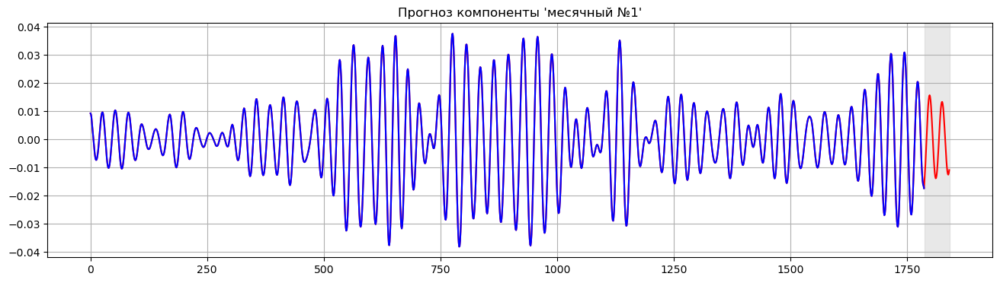

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

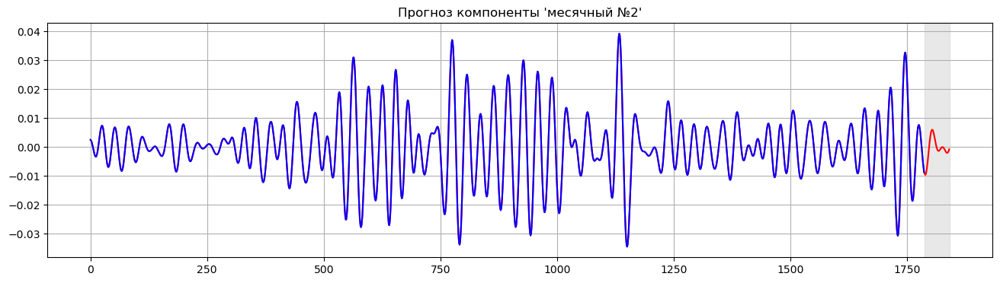

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

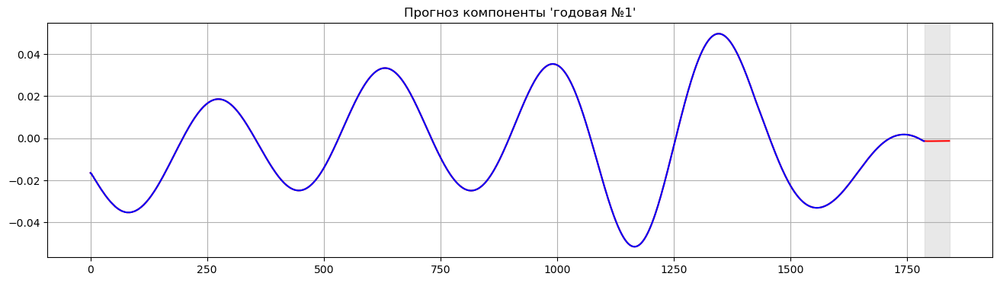

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

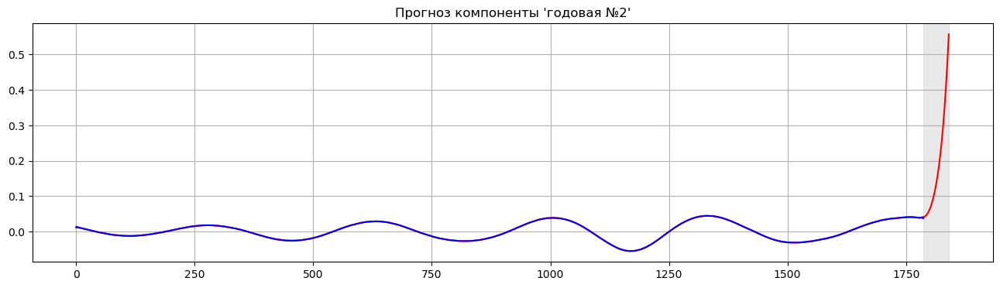

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

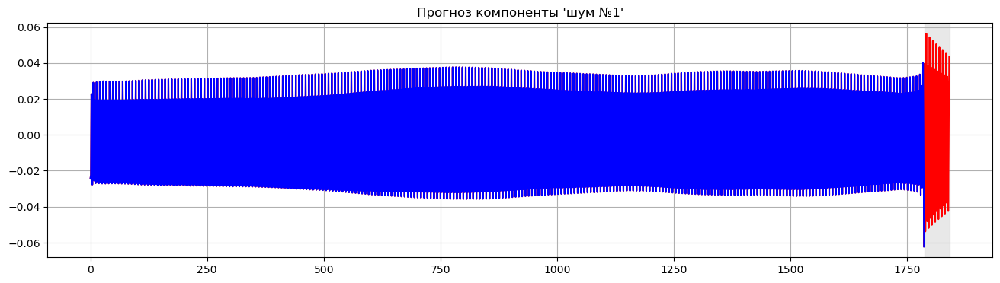

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

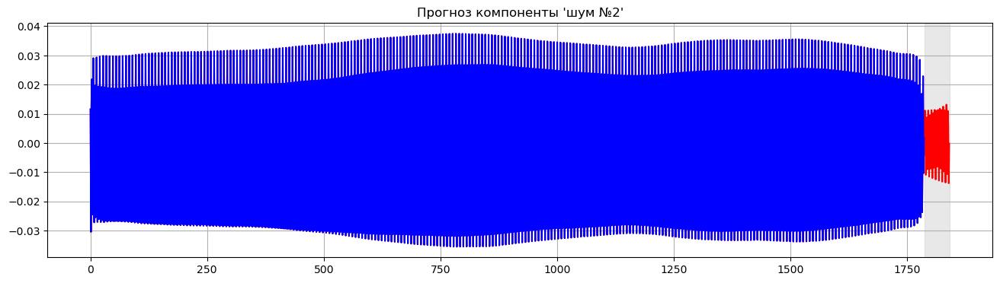

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

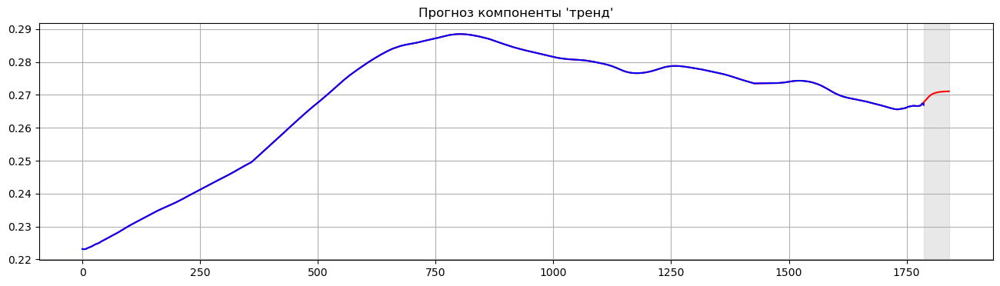

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

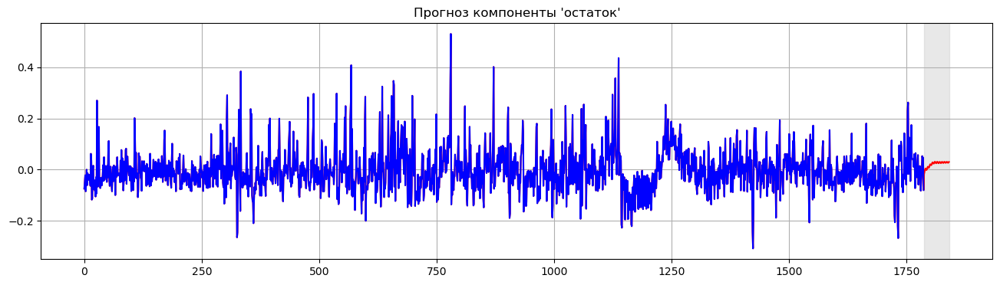

In [57]:
# прогноз LSTM

n_predictions = ts_prov.shape[0]
summ_pred_NN = np.zeros(n_predictions)

for key in ts_components.keys():
    # загружаю модель
    model = load_model(path_to_local_data + '/models/' + ts_components[key]['model_NN'])
    # получаем предсказание
    features = ts_components[key]['X']
    for i in range(n_predictions):
        test_features = []
        test_features.append(np.array(features[-ts_components[key]['L_model_NN']:]))
        test_features = np.array(test_features)
        test_features = np.reshape(test_features, (test_features.shape[0], test_features.shape[1], 1))   
        pred = test_predict(model, test_features)
        features = np.append(features, pred)
    # суммируем предсказания по составляющим временного ряда
    summ_pred_NN = summ_pred_NN + features[-n_predictions:]
    # рисуем
    plt.figure(figsize = (16, 4))
    plt.plot(features, color = 'red')
    plt.plot(features[:-n_predictions], color = 'blue')
    plt.title(f"Прогноз компоненты '{key}'")
    plt.axvspan(len(ts), len(features), alpha = 0.5, color = 'lightgrey')
    plt.grid()
    plt.show()

In [58]:
summ = [summ_pred_ARIMA, summ_pred_NN]
titles = ['Сумма прогнозов компонент ARIMA', 'Сумма прогнозов компонент LSTM']

n_rows = 2

def pict_prov(shift = 0):
    fig = plt.figure(figsize=(16,10))
    axes = fig.subplots(n_rows, 1)
    for row_num in range(n_rows):
        # ошибка
        error = [ts_prov[-ts_prov.shape[0]:][i] - summ[row_num][-ts_prov.shape[0]:][i] \
                 for i in range(ts_prov.shape[0])]
        # рисую
        ax = axes[row_num]
        ax.plot(summ[row_num][-ts_prov.shape[0] + shift:], color = 'red', label = 'прогноз')
        ax.plot(ts_prov[-ts_prov.shape[0] + shift:], color = 'blue', label = 'истинные значения') 
        ax.plot(error[shift:], color = 'green', label = 'ошибка')
        ax.set_title(titles[row_num])
        ax.legend()
        ax.grid()
    fig.tight_layout()
    plt.show()
    # печатаю метрики прогноза по сумме прогнозов компонент ряда
    print(f'RMSE на норм. данных (ARIMA): ' \
          f'{np.sqrt(mean_squared_error(ts_prov[shift:], summ[0][-ts_prov.shape[0] + shift:]))}')
    print(f'RMSE на норм. данных (LSTM):  ' \
          f'{np.sqrt(mean_squared_error(ts_prov[shift:], summ[1][-ts_prov.shape[0] + shift:]))}')

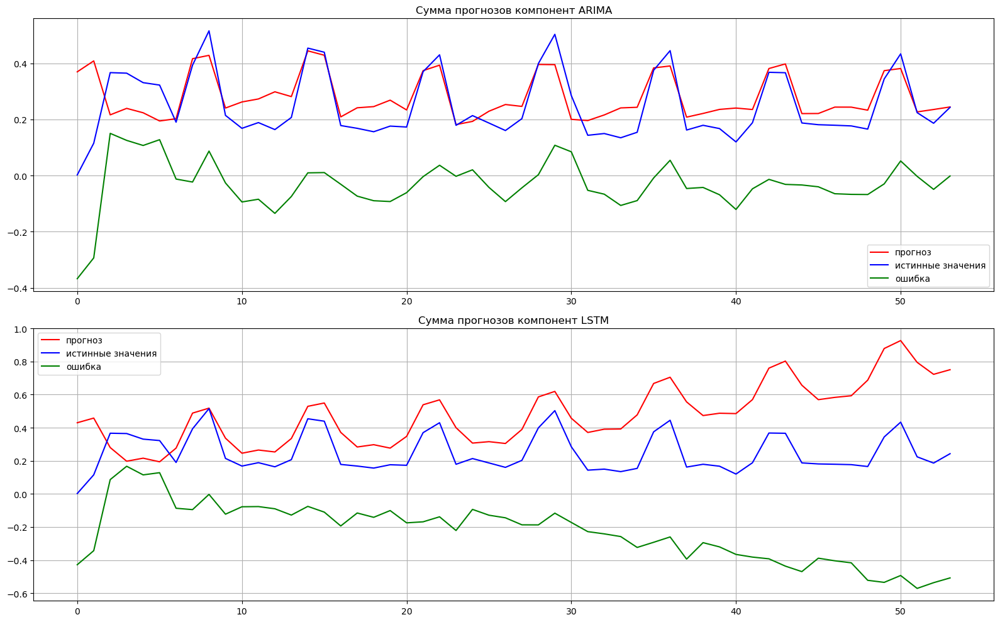

RMSE на норм. данных (ARIMA): 0.09358483756345669
RMSE на норм. данных (LSTM):  0.2917859726761129


In [59]:
# рисуем и печатаем rmse
pict_prov()

    Более точный прогноз получился в случае применения методики ARIMA.
    Дополнительно можно сказать, что высокая ошибка в случае применения обоих методов объясняется наличием существенных по величине выбросов в значении измерений 1 и 2 января 2022 года (праздничные дни, нулевой оборот в продажах).

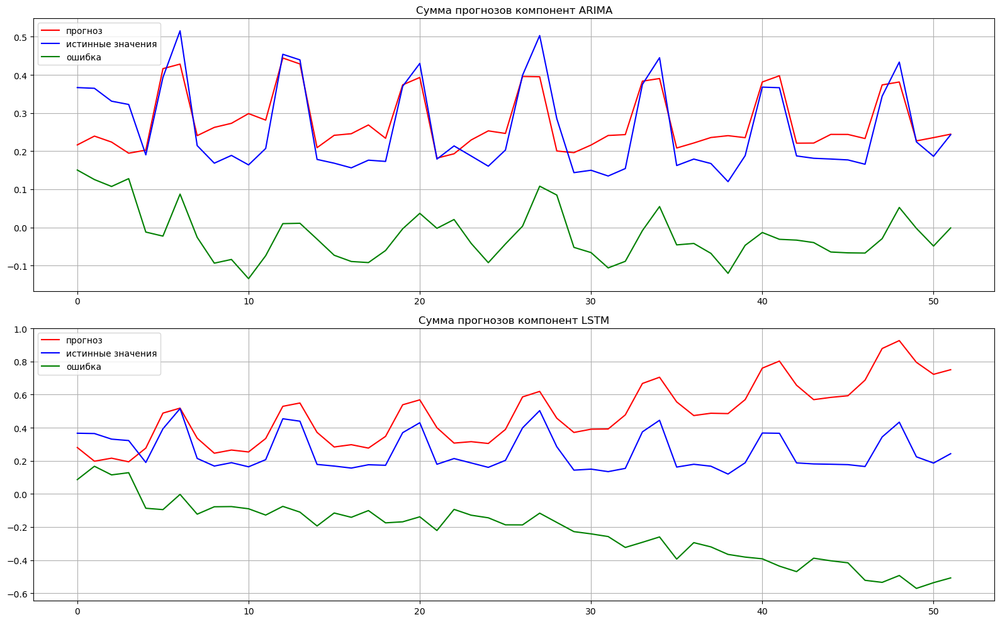

RMSE на норм. данных (ARIMA): 0.06964807292985893
RMSE на норм. данных (LSTM):  0.28746644123717824


In [60]:
# отсеку первые 2 значения прогноза - прогноз на не рабочие дни
pict_prov(2)

    Ошибка заметно снизилась.
    Полученный прогноз можно взять за ориентир.

* [Содержание](#Table-Of-Contents)

<a id="Conclusion"></a>
# 7. Выводы

    Целью данной дипломной работы является исследование практической применимости статистического метода прогнозирования объемов продаж и получение прогнозных данных об объеме продаж на требуемый период в розничной сети производителя мягкой мебели.
    В работе были использованы реальные данные о продажах за 5 лет работы.
    В ходе работы проведено исследование и подготовка исходного временного ряда для анализа статистическими методами, проанализированы критерии стационарности временного ряда и сделан вывод о его стационарности и, следовательно, готовности к прогнозированию, выдвинута и проверена гипотеза о возможном улучшении качества прогноза в случае обработки временного ряда с предварительным разбиением на составляющие, предложен, реализован и применен метод выделения компонентов исходного временного ряда (SSA), предложены метрики качества модели и прогноза, реализованы 2 метода прогнозирования (ARIMA и LSTM), каждый в варианте без разложения исходного временного ряда на компоненты и с разложением, на основании сравнения результатов прогноза выбран лучший метод и вариант.
    В заключение, составлен прогноз на период 54 дня. Прогноз проверен на реальных данных о продажах за тот же период.
    Основные выводы:
    - методы ARIMA и LSTM дают примерно одинаковое качество прогноза на валидационных данных
    - разложение временного ряда на компоненты, с последующим формированием прогноза по каждой компоненте и получением итогового прогноза, как суммы прогнозов компонентов, улучшает качество прогноза по сравнению с прогнозированием по данным исходного временного ряда без разложения на компоненты до 10-12% (на имеющихся данных по продажам)
    - технически LSTM требует больше вычислительных мощностей и работает дольше

    Практическое применение обученных моделей показало, что на имеющихся данных можно достигнуть точности прогноза 7-14% на горизонте планирования 2 месяца.

* [Содержание](#Table-Of-Contents)

In [61]:
print('Затраченное время (hh:mm:ss.ms) {}'.format(datetime.now() - start_time))

Затраченное время (hh:mm:ss.ms) 1:09:46.383904
